In [57]:
import os
import cv2
import random
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.applications.inception_v3 import preprocess_input
import tensorflow as tf
from tensorflow.keras import layers, metrics, Model
from tensorflow.keras.applications import Xception
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, LearningRateScheduler
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import datetime

# Set random seeds for consistency
random.seed(5)
np.random.seed(5)
tf.random.set_seed(5)

# Directories
ROOT = "/Users/pavlovichv/Desktop/Extracted Faces/Extracted Faces"
TARGET_SHAPE = (128, 128)  # Target shape for resizing images

def read_image(directory, folder, image_name):
    path = os.path.join(directory, folder, image_name)
    image = cv2.imread(path)
    if image is None:
        raise ValueError(f"Unable to read image at {path}")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, TARGET_SHAPE)
    return image

def split_dataset(directory, split=0.7):
    folders = [f for f in os.listdir(directory) if os.path.isdir(os.path.join(directory, f))]
    num_train = int(len(folders) * split)
  
    random.shuffle(folders)
  
    train_list = {folder: len(os.listdir(os.path.join(directory, folder))) for folder in folders[:num_train]}
    test_list = {folder: len(os.listdir(os.path.join(directory, folder))) for folder in folders[num_train:]}
  
    return train_list, test_list

def create_triplets(directory, folder_list, max_files=10):
    triplets = []
    folders = list(folder_list.keys())
  
    for folder in folders:
        path = os.path.join(directory, folder)
        files = [f for f in os.listdir(path) if os.path.isfile(os.path.join(path, f))][:max_files]
        num_files = len(files)
      
        for i in range(num_files - 1):
            for j in range(i + 1, num_files):
                anchor = (folder, files[i])
                positive = (folder, files[j])

                neg_folder = folder
                while neg_folder == folder:
                    neg_folder = random.choice(folders)
                neg_files = [f for f in os.listdir(os.path.join(directory, neg_folder)) if os.path.isfile(os.path.join(directory, neg_folder, f))]
                negative = (neg_folder, random.choice(neg_files))

                triplets.append((anchor, positive, negative))
  
    random.shuffle(triplets)
    return triplets

# Split the dataset
train_list, test_list = split_dataset(ROOT, split=0.7)

# Create triplets
train_triplet = create_triplets(ROOT, train_list)
test_triplet = create_triplets(ROOT, test_list)

print("Number of training triplets:", len(train_triplet))
print("Number of testing triplets:", len(test_triplet))
print("Total triplets:", len(train_triplet) + len(test_triplet))

print("\nExamples of triplets:")
for i in range(5):
    print(train_triplet[i])

def augment_image(image):
    datagen = ImageDataGenerator(
        rotation_range=30,
        width_shift_range=0.3,
        height_shift_range=0.3,
        shear_range=0.3,
        zoom_range=0.3,
        horizontal_flip=True,
        fill_mode='nearest'
    )
    image = image.reshape((1,) + image.shape)  # Reshape image to (1, height, width, channels)
    iterator = datagen.flow(image, batch_size=1)
    augmented_image = next(iterator)[0]  # Use next(iterator) to get the augmented image
    return augmented_image

def get_batch(triplet_list, batch_size=64, preprocess=True, augment=False):
    batch_steps = max(1, len(triplet_list) // batch_size)  # Ensure at least 1 step per epoch
  
    for i in range(batch_steps):
        anchor = []
        positive = []
        negative = []
      
        j = i * batch_size
        while j < (i + 1) * batch_size and j < len(triplet_list):
            a, p, n = triplet_list[j]
            a_img = read_image(ROOT, a[0], a[1])
            p_img = read_image(ROOT, p[0], p[1])
            n_img = read_image(ROOT, n[0], n[1])
          
            if augment:
                a_img = augment_image(a_img)
                p_img = augment_image(p_img)
                n_img = augment_image(n_img)
              
            if a_img is not None and p_img is not None and n_img is not None:
                anchor.append(a_img)
                positive.append(p_img)
                negative.append(n_img)
            j += 1
      
        anchor = np.array(anchor)
        positive = np.array(positive)
        negative = np.array(negative)
      
        if preprocess:
            anchor = preprocess_input(anchor)
            positive = preprocess_input(positive)
            negative = preprocess_input(negative)
      
        yield (anchor, positive, negative)

# Visualization
num_plots = 10
f, axes = plt.subplots(num_plots, 3, figsize=(15, 20))

for x in get_batch(train_triplet, batch_size=num_plots, preprocess=False):
    a, p, n = x
    for i in range(num_plots):
        axes[i, 0].imshow(a[i])
        axes[i, 1].imshow(p[i])
        axes[i, 2].imshow(n[i])
    break

plt.show()

# Define the Encoder
def get_encoder(input_shape):
    """ Returns the image encoding model """
    pretrained_model = Xception(
        input_shape=input_shape,
        weights='imagenet',
        include_top=False,
        pooling='avg',
    )
  
    for layer in pretrained_model.layers[-30:]:  # Unfreeze the last 30 layers for fine-tuning
        layer.trainable = True

    inputs = layers.Input(shape=input_shape)
    x = pretrained_model(inputs, training=False)
    x = layers.Flatten()(x)
    x = layers.Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.Lambda(lambda x: tf.math.l2_normalize(x, axis=1))(x)
    return Model(inputs, x, name="Encode_Model")

# Define the Distance Layer
class DistanceLayer(layers.Layer):
    # A layer to compute ‖f(A) - f(P)‖² and ‖f(A) - f(N)‖²
    def __init__(self, **kwargs):
        super().__init__(**kwargs)

    def call(self, anchor, positive, negative):
        ap_distance = tf.reduce_sum(tf.square(anchor - positive), -1)
        an_distance = tf.reduce_sum(tf.square(anchor - negative), -1)
        return (ap_distance, an_distance)

# Define the Siamese Network
def get_siamese_network(input_shape=(128, 128, 3)):
    encoder = get_encoder(input_shape)
  
    # Input Layers for the images
    anchor_input   = layers.Input(input_shape, name="Anchor_Input")
    positive_input = layers.Input(input_shape, name="Positive_Input")
    negative_input = layers.Input(input_shape, name="Negative_Input")
  
    # Generate the encodings (feature vectors) for the images
    encoded_a = encoder(anchor_input)
    encoded_p = encoder(positive_input)
    encoded_n = encoder(negative_input)
  
    # A layer to compute ‖f(A) - f(P)‖² and ‖f(A) - f(N)‖²
    distances = DistanceLayer()(
        encoded_a,
        encoded_p,
        encoded_n
    )
  
    # Creating the Model
    siamese_network = Model(
        inputs  = [anchor_input, positive_input, negative_input],
        outputs = distances,
        name = "Siamese_Network"
    )
    return siamese_network

# Define Custom Triplet Loss
class TripletLoss(tf.keras.losses.Loss):
    def __init__(self, margin=1.0, name='triplet_loss'):
        super().__init__(name=name)
        self.margin = margin

    def call(self, y_true, y_pred):
        ap_distance, an_distance = y_pred
        loss = tf.maximum(ap_distance - an_distance + self.margin, 0.0)
        return tf.reduce_mean(loss)

# Define the SiameseModel with custom training and testing steps
class SiameseModel(Model):
    def __init__(self, siamese_network, margin=1.0):
        super(SiameseModel, self).__init__()
        self.margin = margin
        self.siamese_network = siamese_network
        self.loss_tracker = metrics.Mean(name="loss")
        self.triplet_loss = TripletLoss(margin=margin)

    def call(self, inputs):
        return self.siamese_network(inputs)

    def train_step(self, data):
        anchor, positive, negative = data
        dummy_y_true = tf.ones((tf.shape(anchor)[0], 1))  # Create a dummy tensor for y_true
        with tf.GradientTape() as tape:
            ap_distance, an_distance = self.siamese_network([anchor, positive, negative])
            loss = self.triplet_loss(dummy_y_true, (ap_distance, an_distance))
        
        gradients = tape.gradient(loss, self.siamese_network.trainable_weights)
        self.optimizer.apply_gradients(zip(gradients, self.siamese_network.trainable_weights))
        
        self.loss_tracker.update_state(loss)
        return {"loss": self.loss_tracker.result()}

    def test_step(self, data):
        anchor, positive, negative = data
        dummy_y_true = tf.ones((tf.shape(anchor)[0], 1))  # Create a dummy tensor for y_true
        ap_distance, an_distance = self.siamese_network([anchor, positive, negative])
        loss = self.triplet_loss(dummy_y_true, (ap_distance, an_distance))
        
        self.loss_tracker.update_state(loss)
        return {"loss": self.loss_tracker.result()}

    @property
    def metrics(self):
        return [self.loss_tracker]

# Compile the model
input_shape = (128, 128, 3)
siamese_network = get_siamese_network(input_shape)
siamese_model = SiameseModel(siamese_network, margin=1.0)

# Replace optimizer with the standard Adam optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)  # Adjusted learning rate
siamese_model.compile(optimizer=optimizer)

# Add callbacks
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=5,
    min_lr=1e-7,
    verbose=1
)

early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True,
    verbose=1
)

def scheduler(epoch, lr):
    if epoch < 10:
        return float(lr)
    else:
        return float(lr * tf.math.exp(-0.1))

lr_scheduler = LearningRateScheduler(scheduler)

# TensorBoard for better visualization
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

# Convert batches to dataset
def batch_to_dataset(triplets, batch_size):
    def generator():
        for batch in get_batch(triplets, batch_size=batch_size, preprocess=True, augment=True):  # Enable augmentation
            yield batch
  
    return tf.data.Dataset.from_generator(generator, output_signature=(
        (tf.TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32),
         tf.TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32),
         tf.TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32))
    )).repeat()  # Ensure the dataset repeats

# Convert training and testing triplets to datasets
batch_size = 128  # Increase the batch size
train_dataset = batch_to_dataset(train_triplet, batch_size=batch_size)
test_dataset = batch_to_dataset(test_triplet, batch_size=batch_size)

# Calculate steps per epoch
steps_per_epoch = max(1, len(train_triplet) // batch_size)
validation_steps = max(1, len(test_triplet) // batch_size)

# Testing the model
def test_on_triplets(batch_size=128):
    pos_scores = []
    neg_scores = []

    for data in get_batch(test_triplet, batch_size=batch_size):
        anchor, positive, negative = data
        prediction = siamese_model([anchor, positive, negative])
        pos_scores += list(prediction[0].numpy())  # Convert tensor to numpy
        neg_scores += list(prediction[1].numpy())  # Convert tensor to numpy
  
    accuracy = np.sum(np.array(pos_scores) < np.array(neg_scores)) / len(pos_scores)
    ap_mean = np.mean(pos_scores)
    an_mean = np.mean(neg_scores)
    ap_stds = np.std(pos_scores)
    an_stds = np.std(neg_scores)
  
    print(f"Accuracy on test = {accuracy:.5f}")
    return (accuracy, ap_mean, an_mean, ap_stds, an_stds)

# Custom callback for accuracy calculation
class AccuracyCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        test_results = test_on_triplets(batch_size=128)
        print(f"Epoch {epoch + 1}: Accuracy on test = {test_results[0]:.5f}, "
              f"Loss = {logs['loss']:.5f}, Val Loss = {logs['val_loss']:.5f}, "
              f"AP Mean = {test_results[1]:.5f}, AN Mean = {test_results[2]:.5f}")

accuracy_callback = AccuracyCallback()

# Training the Model using fit
history = siamese_model.fit(
    train_dataset,
    epochs=100,
    validation_data=test_dataset,
    callbacks=[reduce_lr, early_stopping, accuracy_callback, tensorboard_callback, lr_scheduler],
    steps_per_epoch=steps_per_epoch,
    validation_steps=validation_steps
)

# Saving the model after all epochs run
siamese_model.save_weights("siamese_model-final-Vladington3.weights.h5")

# Final test results
test_results = test_on_triplets(batch_size=128)
print(f"Test results: {test_results}")


Number of training triplets: 8287
Number of testing triplets: 2989
Total triplets: 11276

Examples of triplets:
(('143', '0.jpg'), ('143', '4.jpg'), ('957', '0.jpg'))
(('329', '2.jpg'), ('329', '3.jpg'), ('40', '3.jpg'))
(('409', '12.jpg'), ('409', '5.jpg'), ('739', '0.jpg'))
(('531', '12.jpg'), ('531', '14.jpg'), ('293', '1.jpg'))
(('480', '0.jpg'), ('480', '2.jpg'), ('1221', '3.jpg'))


KeyboardInterrupt: 

In [ ]:
import os

# Print the current working directory
print("Current working directory:", os.getcwd())

# Optionally, change the working directory to a specific path
# os.chdir("/path/to/your/desired/directory")


Current working directory: c:\Users\pavlovichv


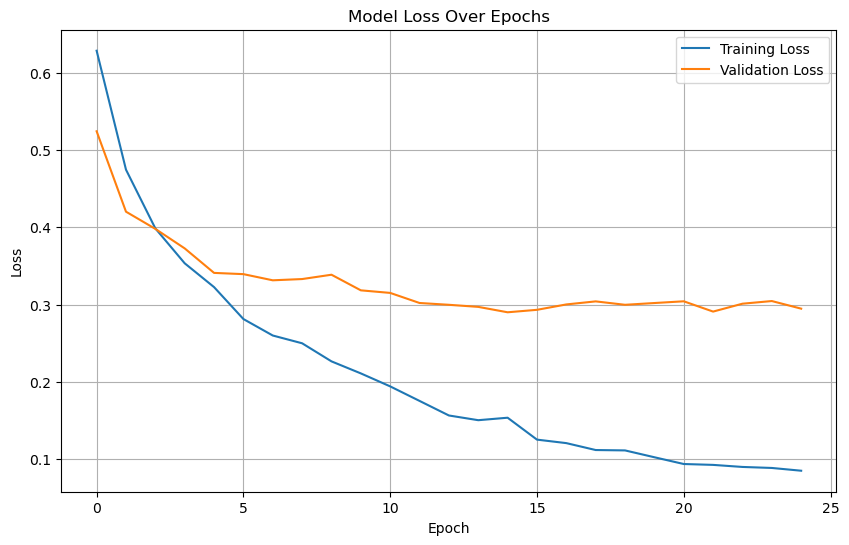

In [ ]:
import matplotlib.pyplot as plt

# Assuming 'history' is the variable storing the training history from model.fit()
def plot_loss(history):
    plt.figure(figsize=(10, 6))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss Over Epochs')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend(loc='upper right')
    plt.grid(True)
    plt.show()

# Plot the loss
plot_loss(history)


In [ ]:
import cv2
import os

# Path to the folder containing images
input_folder = '/Users/pavlovichv/Desktop/TestImages'
output_folder = '/Users/pavlovichv/Desktop/TestImages'

# Create the output folder if it doesn't exist
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# Load the pre-trained Haar Cascade classifier for face detection
haar_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Function to detect and save faces from an image
def detect_and_save_faces(image_path, output_folder, file_name):
    # Read the image
    img = cv2.imread(image_path)
    if img is None:
        print(f"Cannot read image: {image_path}")
        return

    # Convert the image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Detect faces
    faces = haar_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))

    # Iterate over detected faces and save them
    for i, (x, y, w, h) in enumerate(faces):
        face = img[y:y+h, x:x+w]
        face_file_name = os.path.join(output_folder, f"{os.path.splitext(file_name)[0]}_face_{i+1}.jpg")
        cv2.imwrite(face_file_name, face)
        print(f"Face saved: {face_file_name}")

# Iterate through all images in the input folder
for file_name in os.listdir(input_folder):
    image_path = os.path.join(input_folder, file_name)
    detect_and_save_faces(image_path, output_folder, file_name)


Face saved: /Users/pavlovichv/Desktop/TestImages\075a3e67c1e6415ca47d6cd6fe25b566_face_1.jpg
Face saved: /Users/pavlovichv/Desktop/TestImages\AaronPerisol_face_1_face_1.jpg
Face saved: /Users/pavlovichv/Desktop/TestImages\AaronPerisol_face_1_face_1_face_1.jpg
Face saved: /Users/pavlovichv/Desktop/TestImages\gettyimages-1064769920_1-82442a6de028400ea4f8d0d7148f0b6e_face_1.jpg
Face saved: /Users/pavlovichv/Desktop/TestImages\gettyimages-1064769920_1-82442a6de028400ea4f8d0d7148f0b6e_face_1_face_1.jpg
Face saved: /Users/pavlovichv/Desktop/TestImages\ig-obama-portrait-800x480_face_1.jpg
Face saved: /Users/pavlovichv/Desktop/TestImages\images_face_1.jpg
Face saved: /Users/pavlovichv/Desktop/TestImages\images_face_2.jpg
Face saved: /Users/pavlovichv/Desktop/TestImages\images_face_1_face_1.jpg
Face saved: /Users/pavlovichv/Desktop/TestImages\stephen-curry-mvp-season-1jpg_face_1.jpg
Face saved: /Users/pavlovichv/Desktop/TestImages\stephen-curry-mvp-season-1jpg_face_2.jpg
Face saved: /Users/pavl

Save Encodings

In [ ]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications.inception_v3 import preprocess_input
import pickle


# Load the trained Siamese model
def load_siamese_model(weights_path):
   input_shape = (128, 128, 3)
   siamese_network = get_siamese_network(input_shape)
   siamese_model = SiameseModel(siamese_network, margin=1.0)


   # Dummy data to build the model
   dummy_data = [
       np.random.random((1, 128, 128, 3)),
       np.random.random((1, 128, 128, 3)),
       np.random.random((1, 128, 128, 3))
   ]
   siamese_model(dummy_data)


   # Load the trained model weights
   siamese_model.load_weights(weights_path)
   return siamese_model


# Function to read and preprocess image
def preprocess_image(image_path, target_shape=(128, 128)):
   image = cv2.imread(image_path)
   if image is None:
       raise ValueError(f"Unable to read image at {image_path}")
   image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
   image = cv2.resize(image, target_shape)
   image = preprocess_input(image)
   return np.expand_dims(image, axis=0)


# Function to extract embedding from an image using the encoder
def get_embedding(model, image_path):
   image = preprocess_image(image_path)
   embedding = model.siamese_network.get_layer('Encode_Model')(image)
   return embedding.numpy()


# Create a database of known persons' embeddings from folder structure
def create_embedding_database(model, base_folder):
   database = {}
   for person_name in os.listdir(base_folder):
       person_folder = os.path.join(base_folder, person_name)
       if os.path.isdir(person_folder):
           embeddings = []
           for image_name in os.listdir(person_folder):
               image_path = os.path.join(person_folder, image_name)
               try:
                   embedding = get_embedding(model, image_path)
                   embeddings.append(embedding)
               except ValueError as e:
                   print(e)
           if embeddings:
               database[person_name] = np.mean(embeddings, axis=0)
   return database


# Load the Siamese model
weights_path = "siamese_model-final-Vladington2.weights.h5"
siamese_model = load_siamese_model(weights_path)


# Create the embedding database and save to .pkl file
base_folder = "/Users/pavlovichv/Desktop/Extracted Faces/Extracted Faces" 
database = create_embedding_database(siamese_model, base_folder)


# Save the database to a .pkl file
with open('embedding_database4.pkl', 'wb') as f:
   pickle.dump(database, f)





In [ ]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications.inception_v3 import preprocess_input
from sklearn.metrics.pairwise import cosine_similarity
import pickle


# Load the trained Siamese model
def load_siamese_model(weights_path):
   input_shape = (128, 128, 3)
   siamese_network = get_siamese_network(input_shape)
   siamese_model = SiameseModel(siamese_network, margin=1.0)


   # Dummy data to build the model
   dummy_data = [
       np.random.random((1, 128, 128, 3)),
       np.random.random((1, 128, 128, 3)),
       np.random.random((1, 128, 128, 3))
   ]
   siamese_model(dummy_data)


   # Load the trained model weights
   siamese_model.load_weights(weights_path)
   return siamese_model


# Function to read and preprocess image
def preprocess_image(image_path, target_shape=(128, 128)):
   image = cv2.imread(image_path)
   if image is None:
       raise ValueError(f"Unable to read image at {image_path}")
   image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
   image = cv2.resize(image, target_shape)
   image = preprocess_input(image)
   return np.expand_dims(image, axis=0)


# Function to extract embedding from an image using the encoder
def get_embedding(model, image_path):
   image = preprocess_image(image_path)
   embedding = model.siamese_network.get_layer('Encode_Model')(image)
   return embedding.numpy()


# Function to classify a person using a single image
def classify_person(model, database, test_image_path, threshold=0.5):
   test_embedding = get_embedding(model, test_image_path)
  
   best_match = None
   highest_similarity = -1
  
   for name, embedding in database.items():
       similarity = cosine_similarity(test_embedding, embedding.reshape(1, -1))[0][0]
       if similarity > highest_similarity:
           highest_similarity = similarity
           best_match = name
          
   print(f"Highest Similarity: {highest_similarity}")
   if highest_similarity > threshold:
       return best_match
   else:
       return "Unknown"


# Load the Siamese model
weights_path = "siamese_model-final-Vladington2.weights.h5"
siamese_model = load_siamese_model(weights_path)


# Load the embedding database from the .pkl file
with open('embedding_database4.pkl', 'rb') as f:
   database = pickle.load(f)


# Classify a test image
test_image_path = "/Users/pavlovichv/Desktop/Extracted Faces/Extracted Faces/TestFaces/Steph Curry_face_1.jpg"
recognized_person = classify_person(siamese_model, database, test_image_path, threshold=0.89)


print("Recognized Person: ", recognized_person)





Highest Similarity: 0.8984740972518921
Recognized Person:  423


Incremental Learning New Person

In [ ]:
import os
import cv2
import random
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications.inception_v3 import preprocess_input
from tensorflow.keras import layers, metrics, Model
from tensorflow.keras.applications import Xception
from tensorflow.keras.losses import Loss
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import pickle
from collections import defaultdict

# Set random seeds for consistency
random.seed(5)
np.random.seed(5)
tf.random.set_seed(5)

# Directories
ROOT = "/Users/pavlovichv/Desktop/Extracted Faces/Extracted Faces"
TARGET_SHAPE = (128, 128)  # Target shape for resizing images

# Define the encoder model
def get_encoder(input_shape):
    """ Returns the image encoding model """
    pretrained_model = Xception(
        input_shape=input_shape,
        weights='imagenet',
        include_top=False,
        pooling='avg',
    )
  
    for layer in pretrained_model.layers[-30:]:  # Unfreeze the last 30 layers for fine-tuning
        layer.trainable = True

    inputs = layers.Input(shape=input_shape)
    x = pretrained_model(inputs, training=False)
    x = layers.Flatten()(x)
    x = layers.Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.Lambda(lambda x: tf.math.l2_normalize(x, axis=1))(x)
    return Model(inputs, x, name="Encode_Model")

# Define the distance layer
class DistanceLayer(layers.Layer):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)

    def call(self, inputs):
        anchor, positive, negative = inputs
        ap_distance = tf.reduce_sum(tf.square(anchor - positive), -1)
        an_distance = tf.reduce_sum(tf.square(anchor - negative), -1)
        return ap_distance, an_distance

# Define the Siamese network
def get_siamese_network(input_shape=(128, 128, 3)):
    encoder = get_encoder(input_shape)

    # Input layers for the images
    anchor_input = layers.Input(input_shape, name="Anchor_Input")
    positive_input = layers.Input(input_shape, name="Positive_Input")
    negative_input = layers.Input(input_shape, name="Negative_Input")

    # Generate the encodings (feature vectors) for the images
    encoded_a = encoder(anchor_input)
    encoded_p = encoder(positive_input)
    encoded_n = encoder(negative_input)

    # A layer to compute ‖f(A) - f(P)‖² and ‖f(A) - f(N)‖²
    distances = DistanceLayer()([encoded_a, encoded_p, encoded_n])

    # Creating the Model
    siamese_network = Model(
        inputs=[anchor_input, positive_input, negative_input],
        outputs=distances,
        name="Siamese_Network"
    )
    return siamese_network

# Define custom triplet loss
class TripletLoss(Loss):
    def __init__(self, margin=1.0, name='triplet_loss'):
        super().__init__(name=name)
        self.margin = margin

    def call(self, y_true, y_pred):
        ap_distance, an_distance = y_pred
        loss = tf.maximum(ap_distance - an_distance + self.margin, 0.0)
        return tf.reduce_mean(loss)

# Define the SiameseModel with custom training and testing steps
class SiameseModel(Model):
    def __init__(self, siamese_network, margin=1.0):
        super(SiameseModel, self).__init__()
        self.margin = margin
        self.siamese_network = siamese_network
        self.loss_tracker = metrics.Mean(name="loss")
        self.accuracy_tracker = metrics.Mean(name="accuracy")
        self.triplet_loss = TripletLoss(margin=margin)

    def call(self, inputs):
        return self.siamese_network(inputs)

    def train_step(self, data):
        (anchor, positive, negative), _ = data
        dummy_y_true = tf.ones((tf.shape(anchor)[0], 1))  # Create a dummy tensor for y_true
        with tf.GradientTape() as tape:
            ap_distance, an_distance = self.siamese_network([anchor, positive, negative])
            loss = self.triplet_loss(dummy_y_true, (ap_distance, an_distance))
        
        gradients = tape.gradient(loss, self.siamese_network.trainable_weights)
        self.optimizer.apply_gradients(zip(gradients, self.siamese_network.trainable_weights))
        
        self.loss_tracker.update_state(loss)
        
        accuracy = tf.reduce_mean(tf.cast(ap_distance < an_distance, tf.float32))
        self.accuracy_tracker.update_state(accuracy)
        
        return {"loss": self.loss_tracker.result(), "accuracy": self.accuracy_tracker.result()}

    def test_step(self, data):
        (anchor, positive, negative), _ = data
        dummy_y_true = tf.ones((tf.shape(anchor)[0], 1))  # Create a dummy tensor for y_true
        ap_distance, an_distance = self.siamese_network([anchor, positive, negative])
        loss = self.triplet_loss(dummy_y_true, (ap_distance, an_distance))
        
        self.loss_tracker.update_state(loss)
        
        accuracy = tf.reduce_mean(tf.cast(ap_distance < an_distance, tf.float32))
        self.accuracy_tracker.update_state(accuracy)
        
        return {"loss": self.loss_tracker.result(), "accuracy": self.accuracy_tracker.result()}

    @property
    def metrics(self):
        return [self.loss_tracker, self.accuracy_tracker]

# Custom callback to print loss and accuracy
class PrintMetricsCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        print(f"Epoch {epoch + 1}: Loss = {logs['loss']:.5f}, Accuracy = {logs['accuracy']:.5f}")

# Load the Siamese model
def load_siamese_model(weights_path):
    input_shape = (128, 128, 3)
    siamese_network = get_siamese_network(input_shape)
    siamese_model = SiameseModel(siamese_network, margin=1.0)

    # Dummy data to build the model
    dummy_data = [
        np.random.random((1, 128, 128, 3)),
        np.random.random((1, 128, 128, 3)),
        np.random.random((1, 128, 128, 3))
    ]
    siamese_model(dummy_data)

    # Load the trained model weights
    siamese_model.load_weights(weights_path)
    return siamese_model

# Function to read and preprocess image
def read_image(image_path, target_shape=TARGET_SHAPE):
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError(f"Unable to read image at {image_path}")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, target_shape)
    image = preprocess_input(image)
    return image

# Function to augment image
def augment_image(image, num_augments=10):
    datagen = ImageDataGenerator(
        rotation_range=30,
        width_shift_range=0.3,
        height_shift_range=0.3,
        shear_range=0.3,
        zoom_range=0.3,
        horizontal_flip=True,
        fill_mode='nearest'
    )
    augmented_images = []
    for _ in range(num_augments):
        augmented_image = datagen.random_transform(image)
        augmented_images.append(augmented_image)
    return np.array(augmented_images)

# Function to get image files
def get_image_files(directory):
    image_files = defaultdict(list)
    for subdir, dirs, files in os.walk(directory):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg')):
                label = os.path.basename(subdir)
                image_files[label].append(os.path.join(subdir, file))
    return image_files

# Function to generate triplets
def generate_triplets(image_files, num_triplets):
    triplets = []
    labels = list(image_files.keys())
    
    if len(labels) < 2:
        print("Not enough labels to generate triplets.")
        return triplets
    
    for _ in range(num_triplets):
        anchor_label = random.choice(labels)
        positive_label = anchor_label
        negative_label = random.choice(labels)
        while negative_label == anchor_label:
            negative_label = random.choice(labels)
        
        if len(image_files[anchor_label]) < 2:
            print(f"Not enough images for label {anchor_label} to form a triplet.")
            continue

        anchor_image = random.choice(image_files[anchor_label])
        positive_image = random.choice(image_files[positive_label])
        negative_image = random.choice(image_files[negative_label])
        
        triplets.append((anchor_image, positive_image, negative_image))
    
    return triplets

# Function to create triplets
def create_triplets(anchor_images, positives, existing_images, num_triplets=500):
    triplets = []
    num_existing = len(existing_images)
    for positive in positives:
        for _ in range(num_triplets // len(positives)):
            negative = existing_images[random.randint(0, num_existing - 1)]
            triplets.append((anchor, positive, negative))
    print(f"Generated {len(triplets)} triplets.")
    return triplets

# Function to convert triplets to TensorFlow dataset
def triplet_generator(triplets, batch_size=32):
    while True:
        random.shuffle(triplets)
        for i in range(0, len(triplets), batch_size):
            batch_triplets = triplets[i:i+batch_size]
            anchor_images_batch = np.array([read_image(t[0]) for t in batch_triplets])
            positive_images_batch = np.array([read_image(t[1]) for t in batch_triplets])
            negative_images_batch = np.array([read_image(t[2]) for t in batch_triplets])
            yield (anchor_images_batch, positive_images_batch, negative_images_batch), np.ones(len(batch_triplets))

# Incremental training function
def incremental_train(model, new_images_folder, existing_images_path, batch_size=32, epochs=5):
    # Read and preprocess the new images
    anchor_images = []
    for file in os.listdir(new_images_folder):
        file_path = os.path.join(new_images_folder, file)
        anchor_images.append(read_image(file_path))

    # Augment the new images
    positive_images = []
    for anchor_image in anchor_images:
        positive_images.extend(augment_image(anchor_image, num_augments=10))

    # Load existing images for negatives
    existing_images = get_image_files(existing_images_path)
    
    if not existing_images:
        raise ValueError("No existing images found for generating negatives.")

    # Generate triplets
    num_triplets = 100
    triplets = generate_triplets(existing_images, num_triplets)
    print(f"Generated {len(triplets)} triplets.")
    
    # Compile the model
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss=TripletLoss())
    
    # Fine-tune the model using a generator
    model.fit(
        triplet_generator(triplets, batch_size=batch_size),
        steps_per_epoch=max(1, len(triplets) // batch_size),
        epochs=epochs,
        callbacks=[PrintMetricsCallback()]
    )
    return model

# Load the model and incrementally train
weights_path = "siamese_model-final-Vladington2.weights.h5"
siamese_model = load_siamese_model(weights_path)

# Path to the new folder containing multiple images and existing images
new_images_folder = "/Users/pavlovichv/Desktop/Extracted Faces/Extracted Faces/TestFaces"
existing_images_path = "/Users/pavlovichv/Desktop/Extracted Faces/Extracted Faces/"

# Incrementally train the model
siamese_model = incremental_train(siamese_model, new_images_folder, existing_images_path)



Generated 100 triplets.
Epoch 1/5
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9774 - loss: 0.1068 Epoch 1: Loss = 0.16565, Accuracy = 0.94792
3/3 ━━━━━━━━━━━━━━━━━━━━ 17s 2s/step - accuracy: 0.9701 - loss: 0.1215
Epoch 2/5
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9913 - loss: 0.1496  Epoch 2: Loss = 0.10127, Accuracy = 0.98958
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 2s/step - accuracy: 0.9909 - loss: 0.1376
Epoch 3/5
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9809 - loss: 0.1210   Epoch 3: Loss = 0.09153, Accuracy = 0.98958
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - accuracy: 0.9831 - loss: 0.1136
Epoch 4/5
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 1.0000 - loss: 0.0473Epoch 4: Loss = 0.03534, Accuracy = 1.00000
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - accuracy: 1.0000 - loss: 0.0443
Epoch 5/5
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 1.0000 - loss: 0.0128Epoch 5: Loss = 0.01599, Accuracy = 1.00000
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 2s/step - accuracy: 1.0000 - loss: 0.0136


In [ ]:
import os
import random
from collections import defaultdict

def get_image_files(directory):
    image_files = defaultdict(list)
    for subdir, dirs, files in os.walk(directory):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg')):
                label = os.path.basename(subdir)
                image_files[label].append(os.path.join(subdir, file))
    return image_files

def generate_triplets(image_files, num_triplets):
    triplets = []
    labels = list(image_files.keys())
    
    if len(labels) < 2:
        print("Not enough labels to generate triplets.")
        return triplets
    
    for _ in range(num_triplets):
        anchor_label = random.choice(labels)
        positive_label = anchor_label
        negative_label = random.choice(labels)
        while negative_label == anchor_label:
            negative_label = random.choice(labels)
        
        if len(image_files[anchor_label]) < 2:
            print(f"Not enough images for label {anchor_label} to form a triplet.")
            continue

        anchor_image = random.choice(image_files[anchor_label])
        positive_image = random.choice(image_files[positive_label])
        negative_image = random.choice(image_files[negative_label])
        
        triplets.append((anchor_image, positive_image, negative_image))
    
    return triplets

existing_images_path = "/Users/pavlovichv/Desktop/Extracted Faces/Extracted Faces/"

image_files = get_image_files(existing_images_path)
print(f"Found {sum(len(files) for files in image_files.values())} images across {len(image_files)} labels.")

num_triplets = 100
triplets = generate_triplets(image_files, num_triplets)
print(f"Generated {len(triplets)} triplets.")


Found 6112 images across 1325 labels.
Generated 100 triplets.


In [ ]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications.inception_v3 import preprocess_input
from sklearn.metrics.pairwise import cosine_similarity
import pickle

# Set random seeds for consistency
random.seed(5)
np.random.seed(5)
tf.random.set_seed(5)

# Directories
TEST_FACES_DIR = "/Users/pavlovichv/Desktop/Extracted Faces/Extracted Faces/TestFaces/"
ENCODINGS_FILE = "embedding_database4.pkl"
TARGET_SHAPE = (128, 128)  # Target shape for resizing images

# Function to read and preprocess image
def read_image(image_path, target_shape=TARGET_SHAPE):
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError(f"Unable to read image at {image_path}")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, target_shape)
    image = preprocess_input(image)
    return image

# Load known encodings
with open(ENCODINGS_FILE, 'rb') as f:
    known_encodings = pickle.load(f)

# Create a dictionary to map encoding keys to their labels
labels_mapping = {key: os.path.basename(key).split('_')[0] for key in known_encodings.keys()}

# Print known_encodings structure for debugging
print("Structure of known_encodings:")
for key, value in known_encodings.items():
    print(f"{key}: {type(value)}")

# Function to generate encodings for validation images
def generate_encodings(encoder_model, directory):
    encodings = {}
    for file in os.listdir(directory):
        image_path = os.path.join(directory, file)
        if os.path.isfile(image_path) and file.lower().endswith('.jpg'):
            image = read_image(image_path)
            image = np.expand_dims(image, axis=0)
            encoding = encoder_model.predict(image)
            encodings[image_path] = encoding
    return encodings

# Load the Siamese model
def load_siamese_model(weights_path):
    input_shape = (128, 128, 3)
    siamese_network = get_siamese_network(input_shape)
    siamese_model = SiameseModel(siamese_network, margin=1.0)

    # Dummy data to build the model
    dummy_data = [
        np.random.random((1, 128, 128, 3)),
        np.random.random((1, 128, 128, 3)),
        np.random.random((1, 128, 128, 3))
    ]
    siamese_model(dummy_data)

    # Load the trained model weights
    siamese_model.load_weights(weights_path)
    return siamese_model

# Function to classify a validation image
def classify_image(encoding, known_encodings):
    best_match = None
    highest_similarity = -1
    for known_name, known_encoding in known_encodings.items():
        similarity = cosine_similarity(encoding, known_encoding)
        if similarity > highest_similarity:
            highest_similarity = similarity
            best_match = known_name
    return best_match

# Function to calculate accuracy
def calculate_accuracy(validation_encodings, known_encodings, labels_mapping):
    correct = 0
    total = len(validation_encodings)
    for image_path, encoding in validation_encodings.items():
        true_label = os.path.basename(image_path).split('_')[0]  # Assuming label is part of the filename
        predicted_key = classify_image(encoding, known_encodings)
        predicted_label = labels_mapping[predicted_key]
        if predicted_label == true_label:
            correct += 1
    accuracy = correct / total if total > 0 else 0
    return accuracy

# Load the model
weights_path = "siamese_model-final-Vladington2.weights.h5"
siamese_model = load_siamese_model(weights_path)

# Use the encoder part of the Siamese model
encoder_model = siamese_model.siamese_network.get_layer('Encode_Model')

# Generate encodings for validation images
validation_encodings = generate_encodings(encoder_model, TEST_FACES_DIR)

# Calculate accuracy
accuracy = calculate_accuracy(validation_encodings, known_encodings, labels_mapping)
print(f"Validation Accuracy: {accuracy * 100:.2f}%")


Structure of known_encodings:
0: <class 'numpy.ndarray'>
1: <class 'numpy.ndarray'>
10: <class 'numpy.ndarray'>
1000: <class 'numpy.ndarray'>
1001: <class 'numpy.ndarray'>
1002: <class 'numpy.ndarray'>
1006: <class 'numpy.ndarray'>
1007: <class 'numpy.ndarray'>
101: <class 'numpy.ndarray'>
1013: <class 'numpy.ndarray'>
1014: <class 'numpy.ndarray'>
1015: <class 'numpy.ndarray'>
1016: <class 'numpy.ndarray'>
1017: <class 'numpy.ndarray'>
1018: <class 'numpy.ndarray'>
1019: <class 'numpy.ndarray'>
102: <class 'numpy.ndarray'>
1020: <class 'numpy.ndarray'>
1021: <class 'numpy.ndarray'>
1022: <class 'numpy.ndarray'>
1024: <class 'numpy.ndarray'>
1025: <class 'numpy.ndarray'>
1026: <class 'numpy.ndarray'>
1027: <class 'numpy.ndarray'>
1029: <class 'numpy.ndarray'>
103: <class 'numpy.ndarray'>
1030: <class 'numpy.ndarray'>
1031: <class 'numpy.ndarray'>
1032: <class 'numpy.ndarray'>
1033: <class 'numpy.ndarray'>
1034: <class 'numpy.ndarray'>
1035: <class 'numpy.ndarray'>
1036: <class 'numpy.n

In [ ]:
import os
import cv2
import random
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications.inception_v3 import preprocess_input
from tensorflow.keras import layers, metrics, Model
from tensorflow.keras.applications import Xception
from tensorflow.keras.losses import Loss
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import pickle
from collections import defaultdict
from sklearn.metrics.pairwise import cosine_similarity

# Set random seeds for consistency
random.seed(5)
np.random.seed(5)
tf.random.set_seed(5)

# Directories
ROOT = "/Users/pavlovichv/Desktop/Extracted Faces/Extracted Faces"
TARGET_SHAPE = (128, 128)  # Target shape for resizing images
TEST_FACES_DIR = "/Users/pavlovichv/Desktop/Extracted Faces/Extracted Faces/TestFaces"
ENCODINGS_FILE = "known_faces_encodings.pkl"

# Define the encoder model
def get_encoder(input_shape):
    pretrained_model = Xception(
        input_shape=input_shape,
        weights='imagenet',
        include_top=False,
        pooling='avg',
    )
  
    for layer in pretrained_model.layers[-30:]:
        layer.trainable = True

    inputs = layers.Input(shape=input_shape)
    x = pretrained_model(inputs, training=False)
    x = layers.Flatten()(x)
    x = layers.Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.Lambda(lambda x: tf.math.l2_normalize(x, axis=1))(x)
    return Model(inputs, x, name="Encode_Model")

# Define the distance layer
class DistanceLayer(layers.Layer):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)

    def call(self, inputs):
        anchor, positive, negative = inputs
        ap_distance = tf.reduce_sum(tf.square(anchor - positive), -1)
        an_distance = tf.reduce_sum(tf.square(anchor - negative), -1)
        return ap_distance, an_distance

# Define the Siamese network
def get_siamese_network(input_shape=(128, 128, 3)):
    encoder = get_encoder(input_shape)

    anchor_input = layers.Input(input_shape, name="Anchor_Input")
    positive_input = layers.Input(input_shape, name="Positive_Input")
    negative_input = layers.Input(input_shape, name="Negative_Input")

    encoded_a = encoder(anchor_input)
    encoded_p = encoder(positive_input)
    encoded_n = encoder(negative_input)

    distances = DistanceLayer()([encoded_a, encoded_p, encoded_n])

    siamese_network = Model(
        inputs=[anchor_input, positive_input, negative_input],
        outputs=distances,
        name="Siamese_Network"
    )
    return siamese_network

# Define custom triplet loss
class TripletLoss(Loss):
    def __init__(self, margin=1.0, name='triplet_loss'):
        super().__init__(name=name)
        self.margin = margin

    def call(self, y_true, y_pred):
        ap_distance, an_distance = y_pred
        loss = tf.maximum(ap_distance - an_distance + self.margin, 0.0)
        return tf.reduce_mean(loss)

# Define the SiameseModel with custom training and testing steps
class SiameseModel(Model):
    def __init__(self, siamese_network, margin=1.0):
        super(SiameseModel, self).__init__()
        self.margin = margin
        self.siamese_network = siamese_network
        self.loss_tracker = metrics.Mean(name="loss")
        self.accuracy_tracker = metrics.Mean(name="accuracy")
        self.triplet_loss = TripletLoss(margin=margin)

    def call(self, inputs):
        return self.siamese_network(inputs)

    def train_step(self, data):
        (anchor, positive, negative), _ = data
        dummy_y_true = tf.ones((tf.shape(anchor)[0], 1))
        with tf.GradientTape() as tape:
            ap_distance, an_distance = self.siamese_network([anchor, positive, negative])
            loss = self.triplet_loss(dummy_y_true, (ap_distance, an_distance))
        
        gradients = tape.gradient(loss, self.siamese_network.trainable_weights)
        self.optimizer.apply_gradients(zip(gradients, self.siamese_network.trainable_weights))
        
        self.loss_tracker.update_state(loss)
        accuracy = tf.reduce_mean(tf.cast(ap_distance < an_distance, tf.float32))
        self.accuracy_tracker.update_state(accuracy)
        
        return {"loss": self.loss_tracker.result(), "accuracy": self.accuracy_tracker.result()}

    def test_step(self, data):
        (anchor, positive, negative), _ = data
        dummy_y_true = tf.ones((tf.shape(anchor)[0], 1))
        ap_distance, an_distance = self.siamese_network([anchor, positive, negative])
        loss = self.triplet_loss(dummy_y_true, (ap_distance, an_distance))
        
        self.loss_tracker.update_state(loss)
        accuracy = tf.reduce_mean(tf.cast(ap_distance < an_distance, tf.float32))
        self.accuracy_tracker.update_state(accuracy)
        
        return {"loss": self.loss_tracker.result(), "accuracy": self.accuracy_tracker.result()}

    @property
    def metrics(self):
        return [self.loss_tracker, self.accuracy_tracker]

# Custom callback to print loss and accuracy
class PrintMetricsCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        print(f"Epoch {epoch + 1}: Loss = {logs['loss']:.5f}, Accuracy = {logs['accuracy']:.5f}")

# Load the Siamese model
def load_siamese_model(weights_path):
    input_shape = (128, 128, 3)
    siamese_network = get_siamese_network(input_shape)
    siamese_model = SiameseModel(siamese_network, margin=1.0)

    dummy_data = [
        np.random.random((1, 128, 128, 3)),
        np.random.random((1, 128, 128, 3)),
        np.random.random((1, 128, 128, 3))
    ]
    siamese_model(dummy_data)
    siamese_model.load_weights(weights_path)
    return siamese_model

# Function to read and preprocess image
def read_image(image_path, target_shape=TARGET_SHAPE):
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError(f"Unable to read image at {image_path}")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, target_shape)
    image = preprocess_input(image)
    return image

# Function to augment image
def augment_image(image, num_augments=10):
    datagen = ImageDataGenerator(
        rotation_range=30,
        width_shift_range=0.3,
        height_shift_range=0.3,
        shear_range=0.3,
        zoom_range=0.3,
        horizontal_flip=True,
        fill_mode='nearest'
    )
    augmented_images = []
    for _ in range(num_augments):
        augmented_image = datagen.random_transform(image)
        augmented_images.append(augmented_image)
    return np.array(augmented_images)

# Function to get image files
def get_image_files(directory):
    image_files = defaultdict(list)
    for subdir, dirs, files in os.walk(directory):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg')):
                label = os.path.basename(subdir)
                image_files[label].append(os.path.join(subdir, file))
    return image_files

# Function to generate triplets
def generate_triplets(image_files, num_triplets):
    triplets = []
    labels = list(image_files.keys())
    
    if len(labels) < 2:
        print("Not enough labels to generate triplets.")
        return triplets
    
    for _ in range(num_triplets):
        anchor_label = random.choice(labels)
        positive_label = anchor_label
        negative_label = random.choice(labels)
        while negative_label == anchor_label:
            negative_label = random.choice(labels)
        
        if len(image_files[anchor_label]) < 2:
            print(f"Not enough images for label {anchor_label} to form a triplet.")
            continue

        anchor_image = random.choice(image_files[anchor_label])
        positive_image = random.choice(image_files[positive_label])
        negative_image = random.choice(image_files[negative_label])
        
        triplets.append((anchor_image, positive_image, negative_image))
    
    return triplets

# Function to convert triplets to TensorFlow dataset
def triplet_generator(triplets, batch_size=32):
    while True:
        random.shuffle(triplets)
        for i in range(0, len(triplets), batch_size):
            batch_triplets = triplets[i:i+batch_size]
            anchor_images_batch = np.array([read_image(t[0]) for t in batch_triplets])
            positive_images_batch = np.array([read_image(t[1]) for t in batch_triplets])
            negative_images_batch = np.array([read_image(t[2]) for t in batch_triplets])
            yield (anchor_images_batch, positive_images_batch, negative_images_batch), np.ones(len(batch_triplets))

# Incremental training function
def incremental_train(model, new_images_folder, existing_images_path, batch_size=32, epochs=5):
    # Read and preprocess the new images
    anchor_images = []
    for file in os.listdir(new_images_folder):
        file_path = os.path.join(new_images_folder, file)
        anchor_images.append(read_image(file_path))

    # Augment the new images
    positive_images = []
    for anchor_image in anchor_images:
        positive_images.extend(augment_image(anchor_image, num_augments=10))

    # Load existing images for negatives
    existing_images = get_image_files(existing_images_path)
    
    if not existing_images:
        raise ValueError("No existing images found for generating negatives.")

    # Generate triplets
    num_triplets = 300
    triplets = generate_triplets(existing_images, num_triplets)
    print(f"Generated {len(triplets)} triplets.")
    
    # Compile the model
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss=TripletLoss())
    
    # Fine-tune the model using a generator
    model.fit(
        triplet_generator(triplets, batch_size=batch_size),
        steps_per_epoch=max(1, len(triplets) // batch_size),
        epochs=epochs,
        callbacks=[PrintMetricsCallback()]
    )
    return model

# Function to generate encodings for validation images
def generate_encodings(encoder_model, directory):
    encodings = {}
    for file in os.listdir(directory):
        image_path = os.path.join(directory, file)
        if os.path.isfile(image_path) and file.lower().endswith('.jpg'):
            image = read_image(image_path)
            image = np.expand_dims(image, axis=0)
            encoding = encoder_model.predict(image)
            encodings[image_path] = encoding
    return encodings

# Function to classify a validation image
def classify_image(encoding, known_encodings):
    best_match = None
    highest_similarity = -1
    for known_name, known_encoding in known_encodings.items():
        similarity = cosine_similarity(encoding, known_encoding)
        if similarity > highest_similarity:
            highest_similarity = similarity
            best_match = known_name
    return best_match

# Function to calculate accuracy
def calculate_accuracy(validation_encodings, known_encodings, labels_mapping):
    correct = 0
    total = len(validation_encodings)
    for image_path, encoding in validation_encodings.items():
        true_label = os.path.basename(image_path).split('_')[0]
        predicted_key = classify_image(encoding, known_encodings)
        predicted_label = labels_mapping[predicted_key]
        if predicted_label == true_label:
            correct += 1
    accuracy = correct / total if total > 0 else 0
    return accuracy

# Load known encodings
with open(ENCODINGS_FILE, 'rb') as f:
    known_encodings = pickle.load(f)

# Create a dictionary to map encoding keys to their labels
labels_mapping = {key: os.path.basename(key).split('_')[0] for key in known_encodings.keys()}

# Load the model
weights_path = "siamese_model-final-Vladington2.weights.h5"
siamese_model = load_siamese_model(weights_path)

# Use the encoder part of the Siamese model
encoder_model = siamese_model.siamese_network.get_layer('Encode_Model')

# Incrementally train the model
siamese_model = incremental_train(siamese_model, TEST_FACES_DIR, ROOT)

# Generate encodings for validation images
validation_encodings = generate_encodings(encoder_model, TEST_FACES_DIR)

# Calculate accuracy
accuracy = calculate_accuracy(validation_encodings, known_encodings, labels_mapping)
print(f"Validation Accuracy: {accuracy * 100:.2f}%")


Generated 300 triplets.
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9817 - loss: 0.1224Epoch 1: Loss = 0.15177, Accuracy = 0.96875
9/9 ━━━━━━━━━━━━━━━━━━━━ 27s 2s/step - accuracy: 0.9804 - loss: 0.1254
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9370 - loss: 0.1677Epoch 2: Loss = 0.11757, Accuracy = 0.97106
9/9 ━━━━━━━━━━━━━━━━━━━━ 14s 2s/step - accuracy: 0.9404 - loss: 0.1626
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9861 - loss: 0.1198Epoch 3: Loss = 0.09206, Accuracy = 0.98611
9/9 ━━━━━━━━━━━━━━━━━━━━ 14s 2s/step - accuracy: 0.9861 - loss: 0.1170
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9867 - loss: 0.0509Epoch 4: Loss = 0.03510, Accuracy = 0.99306
9/9 ━━━━━━━━━━━━━━━━━━━━ 15s 2s/step - accuracy: 0.9874 - loss: 0.0493
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 1.0000 - loss: 0.0156Epoch 5: Loss = 0.01315, Accuracy = 1.00000
9/9 ━━━━━━━━━━━━━━━━━━━━ 15s 2s/step - accuracy: 1.0000 - loss: 0.0154
1/1 ━━

In [ ]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications.inception_v3 import preprocess_input
import pickle
from collections import defaultdict

# Set random seeds for consistency
random.seed(5)
np.random.seed(5)
tf.random.set_seed(5)

# Directories
ROOT = "/Users/pavlovichv/Desktop/Extracted Faces/Extracted Faces"
ENCODINGS_FILE = "known_faces_encodingsFinal.pkl"
TARGET_SHAPE = (128, 128)  # Target shape for resizing images

# Function to read and preprocess image
def read_image(image_path, target_shape=TARGET_SHAPE):
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError(f"Unable to read image at {image_path}")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, target_shape)
    image = preprocess_input(image)
    return image

# Load the Siamese model
def load_siamese_model(weights_path):
    input_shape = (128, 128, 3)
    siamese_network = get_siamese_network(input_shape)
    siamese_model = SiameseModel(siamese_network, margin=1.0)

    # Dummy data to build the model
    dummy_data = [
        np.random.random((1, 128, 128, 3)),
        np.random.random((1, 128, 128, 3)),
        np.random.random((1, 128, 128, 3))
    ]
    siamese_model(dummy_data)

    # Load the trained model weights
    siamese_model.load_weights(weights_path)
    return siamese_model

# Function to get image files and their labels
def get_image_files_and_labels(directory):
    image_files = defaultdict(list)
    for subdir, dirs, files in os.walk(directory):
        label = os.path.basename(subdir)
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg')):
                image_files[label].append(os.path.join(subdir, file))
    return image_files

# Function to save encodings with labels
def save_encodings_with_labels(model, image_files, encoding_file):
    encodings = {}
    for label, files in image_files.items():
        for file in files:
            image = read_image(file)
            image = np.expand_dims(image, axis=0)
            encoding = model.predict(image)
            encodings[file] = (encoding, label)
    with open(encoding_file, 'wb') as f:
        pickle.dump(encodings, f)

# Load the model
weights_path = "siamese_model-final-Vladington2.weights.h5"
siamese_model = load_siamese_model(weights_path)
encoder_model = siamese_model.siamese_network.get_layer('Encode_Model')

# Get image files and their labels
image_files = get_image_files_and_labels(ROOT)

# Save encodings with labels
save_encodings_with_labels(encoder_model, image_files, ENCODINGS_FILE)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━

In [ ]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications.inception_v3 import preprocess_input
from sklearn.metrics.pairwise import cosine_similarity
import pickle

# Directories
TEST_FACES_DIR = "/Users/pavlovichv/Desktop/Extracted Faces/Extracted Faces/1"
ENCODINGS_FILE = "known_faces_encodingsFinal.pkl"
TARGET_SHAPE = (128, 128)  # Target shape for resizing images

# Function to read and preprocess image
def read_image(image_path, target_shape=TARGET_SHAPE):
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError(f"Unable to read image at {image_path}")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, target_shape)
    image = preprocess_input(image)
    return image

# Load known encodings
with open(ENCODINGS_FILE, 'rb') as f:
    known_encodings = pickle.load(f)

# Function to generate encodings for validation images
def generate_encodings(model, directory):
    encodings = {}
    for file in os.listdir(directory):
        image_path = os.path.join(directory, file)
        if os.path.isfile(image_path) and file.lower().endswith('.jpg'):
            image = read_image(image_path)
            image = np.expand_dims(image, axis=0)
            encoding = model.predict(image)
            encodings[image_path] = encoding
    return encodings

# Function to classify a validation image
def classify_image(encoding, known_encodings):
    best_match = None
    highest_similarity = -1
    for known_name, (known_encoding, known_label) in known_encodings.items():
        similarity = cosine_similarity(encoding, known_encoding)
        if similarity > highest_similarity:
            highest_similarity = similarity
            best_match = known_label
    return best_match

# Function to calculate accuracy
def calculate_accuracy(validation_encodings, known_encodings):
    correct = 0
    total = len(validation_encodings)
    for image_path, encoding in validation_encodings.items():
        true_label = os.path.basename(image_path).split('_')[0]
        predicted_label = classify_image(encoding, known_encodings)
        if predicted_label == true_label:
            correct += 1
    accuracy = correct / total if total > 0 else 0
    return accuracy

# Load the model
weights_path = "siamese_model-final-Vladington2.weights.h5"
siamese_model = load_siamese_model(weights_path)
encoder_model = siamese_model.siamese_network.get_layer('Encode_Model')

# Generate encodings for validation images
validation_encodings = generate_encodings(encoder_model, TEST_FACES_DIR)

# Calculate accuracy
accuracy = calculate_accuracy(validation_encodings, known_encodings)
print(f"Validation Accuracy: {accuracy * 100:.2f}%")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Validation Accuracy: 0.00%


Cosine Similarity

In [ ]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications.inception_v3 import preprocess_input
from sklearn.metrics.pairwise import cosine_similarity
import pickle

# Function to read and preprocess image
def read_image(image_path, target_shape=(128, 128)):
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError(f"Unable to read image at {image_path}")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, target_shape)
    image = preprocess_input(image)
    return np.expand_dims(image, axis=0)

# Function to classify a single image using known encodings
def classify_single_image(encoder_model, image_path, known_encodings, threshold=0.5):
    # Read and preprocess the image
    image = read_image(image_path)
    
    # Generate encoding for the image
    encoding = encoder_model.predict(image)
    
    best_match = None
    highest_similarity = -1
    for known_name, (known_encoding, known_label) in known_encodings.items():
        similarity = cosine_similarity(encoding, known_encoding)
        if similarity > highest_similarity:
            highest_similarity = similarity
            best_match = known_label

    if highest_similarity < threshold:
        return "Unknown", highest_similarity
    return best_match, highest_similarity

# Load known encodings
ENCODINGS_FILE = "known_faces_encodingsFinal.pkl"
with open(ENCODINGS_FILE, 'rb') as f:
    known_encodings = pickle.load(f)

# Load the model
weights_path = "siamese_model-final-Vladington2.weights.h5"
siamese_model = load_siamese_model(weights_path)
encoder_model = siamese_model.siamese_network.get_layer('Encode_Model')

# Path to a single image for classification
single_image_path = "/Users/pavlovichv/Desktop/TestImages/stephen-curry_face_1.jpg"

# Classify the single image
predicted_label, similarity = classify_single_image(encoder_model, single_image_path, known_encodings)
print(f"Predicted label for the image is: {predicted_label}")
print(f"Similarity: {similarity}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step
Predicted label for the image is: 1515
Similarity: [[0.99036986]]


euclidean distance

In [ ]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications.inception_v3 import preprocess_input
import pickle
from scipy.spatial.distance import euclidean

# Function to read and preprocess image
def read_image(image_path, target_shape=(128, 128)):
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError(f"Unable to read image at {image_path}")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, target_shape)
    image = preprocess_input(image)
    return np.expand_dims(image, axis=0)

# Function to classify a single image using known encodings
def classify_single_image(encoder_model, image_path, known_encodings, threshold=0.5):
    # Read and preprocess the image
    image = read_image(image_path)
    
    # Generate encoding for the image
    encoding = encoder_model.predict(image)
    
    best_match = None
    lowest_distance = float('inf')
    for known_name, (known_encoding, known_label) in known_encodings.items():
        distance = euclidean(encoding.flatten(), known_encoding.flatten())
        if distance < lowest_distance:
            lowest_distance = distance
            best_match = known_label

    if lowest_distance > threshold:
        return "Unknown", lowest_distance
    return best_match, lowest_distance

# Load known encodings
ENCODINGS_FILE = "known_faces_encodingsFinal.pkl"
with open(ENCODINGS_FILE, 'rb') as f:
    known_encodings = pickle.load(f)

# Load the model
weights_path = "siamese_model-final-Vladington2.weights.h5"
siamese_model = load_siamese_model(weights_path)
encoder_model = siamese_model.siamese_network.get_layer('Encode_Model')

# Path to a single image for classification
single_image_path = "/Users/pavlovichv/Desktop/TestImages/stephen-curry_face_1.jpg"

# Classify the single image
predicted_label, distance = classify_single_image(encoder_model, single_image_path, known_encodings)
print(f"Predicted label for the image is: {predicted_label}")
print(f"Distance: {distance}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step
Predicted label for the image is: 1515
Distance: 0.13878080248832703


SVM

In [ ]:
import pickle
import numpy as np
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

# Load known encodings
ENCODINGS_FILE = "known_faces_encodingsFinal.pkl"
with open(ENCODINGS_FILE, 'rb') as f:
    known_encodings = pickle.load(f)

# Prepare data for SVM
X = []
y = []
for file_path, (encoding, label) in known_encodings.items():
    X.append(encoding.flatten())
    y.append(label)

X = np.array(X)
y = np.array(y)

# Train SVM classifier
svm = make_pipeline(StandardScaler(), SVC(kernel='linear', probability=True))
svm.fit(X, y)

# Save the trained SVM model
with open('svm_model.pkl', 'wb') as f:
    pickle.dump(svm, f)


In [ ]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications.inception_v3 import preprocess_input
import pickle

# Function to read and preprocess image
def read_image(image_path, target_shape=(128, 128)):
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError(f"Unable to read image at {image_path}")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, target_shape)
    image = preprocess_input(image)
    return np.expand_dims(image, axis=0)

# Function to classify a single image using SVM
def classify_single_image(encoder_model, svm_model, image_path, threshold=0.5):
    # Read and preprocess the image
    image = read_image(image_path)
    
    # Generate encoding for the image
    encoding = encoder_model.predict(image).flatten()
    
    # Predict using SVM
    prediction = svm_model.predict([encoding])
    probabilities = svm_model.predict_proba([encoding])
    
    # Get the predicted label and probability
    predicted_label = prediction[0]
    highest_probability = probabilities[0].max()
    
    if highest_probability < threshold:
        return "Unknown", highest_probability
    return predicted_label, highest_probability

# Load the trained SVM model
with open('svm_model.pkl', 'rb') as f:
    svm_model = pickle.load(f)

# Load the Siamese model
weights_path = "siamese_model-final-Vladington2.weights.h5"
siamese_model = load_siamese_model(weights_path)
encoder_model = siamese_model.siamese_network.get_layer('Encode_Model')

# Path to a single image for classification
single_image_path = "/Users/pavlovichv/Desktop/Extracted Faces/Extracted Faces/0/0.jpg"

# Classify the single image with different thresholds
thresholds = [0.3, 0.5, 0.7, 0.9]
for threshold in thresholds:
    predicted_label, probability = classify_single_image(encoder_model, svm_model, single_image_path, threshold)
    print(f"Threshold: {threshold} - Predicted label: {predicted_label}, Probability: {probability}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step
Threshold: 0.3 - Predicted label: Unknown, Probability: 0.012385603606162898
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
Threshold: 0.5 - Predicted label: Unknown, Probability: 0.012385603606162898
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
Threshold: 0.7 - Predicted label: Unknown, Probability: 0.012385603606162898
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
Threshold: 0.9 - Predicted label: Unknown, Probability: 0.012385603606162898


KNN

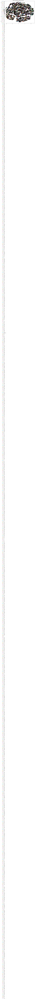

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


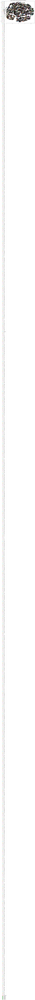

The predicted label for the image is: 1515


In [ ]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications.inception_v3 import preprocess_input
import pickle
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import normalize
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Function to read and preprocess image
def read_image(image_path, target_shape=(128, 128)):
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError(f"Unable to read image at {image_path}")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, target_shape)
    image = preprocess_input(image)
    return np.expand_dims(image, axis=0)

# Load known encodings
ENCODINGS_FILE = "known_faces_encodingsFinal.pkl"
with open(ENCODINGS_FILE, 'rb') as f:
    known_encodings = pickle.load(f)

X = []
labels = []

for known_name, (known_encoding, known_label) in known_encodings.items():
    X.append(known_encoding.flatten())
    labels.append(known_label)

X = normalize(X)

# Train a KNN classifier
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X, labels)

# Reduce the dimensions to 2D using t-SNE
tsne = TSNE(n_components=2, perplexity=30, n_iter=300)
X_2d = tsne.fit_transform(X)

# Plot the clusters with labels
plt.figure(figsize=(12, 8))
for label in set(labels):
    indices = [i for i, l in enumerate(labels) if l == label]
    points = X_2d[indices]
    plt.scatter(points[:, 0], points[:, 1], label=label)

# Add labels to the plot
for i, label in enumerate(labels):
    plt.annotate(label, (X_2d[i, 0], X_2d[i, 1]), fontsize=8, alpha=0.75)

plt.legend()
plt.title("t-SNE visualization of KNN with labels")
plt.show()

# Function to classify a single image and visualize its cluster
def classify_and_visualize_knn(encoder_model, image_path, knn, X_2d, labels):
    # Read and preprocess the image
    image = read_image(image_path)
    
    # Generate encoding for the image
    encoding = encoder_model.predict(image).flatten()
    normalized_encoding = normalize([encoding])[0]
    
    # Predict the label using KNN
    predicted_label = knn.predict([normalized_encoding])[0]
    
    # Find the nearest neighbors
    neighbors = knn.kneighbors([normalized_encoding], return_distance=False)[0]
    
    # Append the new encoding to the existing data for visualization
    X_2d_with_new = np.vstack((X_2d, tsne.fit_transform(np.vstack((X, [normalized_encoding])))[-1]))

    # Visualize the neighbors
    plt.figure(figsize=(12, 8))
    for label in set(labels):
        indices = [i for i, l in enumerate(labels) if l == label]
        points = X_2d[indices]
        plt.scatter(points[:, 0], points[:, 1], label=label)
    
    # Add labels to the plot
    for i, label in enumerate(labels):
        plt.annotate(label, (X_2d[i, 0], X_2d[i, 1]), fontsize=8, alpha=0.75)
    
    # Plot the new image's point and its neighbors
    new_point_2d = X_2d_with_new[-1]
    plt.scatter(new_point_2d[0], new_point_2d[1], color='red', marker='x', s=200, label='New Image')
    
    for neighbor in neighbors:
        plt.scatter(X_2d[neighbor, 0], X_2d[neighbor, 1], color='green', marker='o', s=100, label='Neighbor')

    plt.legend()
    plt.title(f"t-SNE visualization with new image and its neighbors")
    plt.show()
    
    return predicted_label

# Load the model
weights_path = "siamese_model-final-Vladington2.weights.h5"
siamese_model = load_siamese_model(weights_path)
encoder_model = siamese_model.siamese_network.get_layer('Encode_Model')

# Path to a single image for classification
single_image_path = "/Users/pavlovichv/Desktop/TestImages/stephen-curry_face_1.jpg"

# Classify the single image and visualize the neighbors
predicted_label = classify_and_visualize_knn(encoder_model, single_image_path, knn, X_2d, labels)
print(f"The predicted label for the image is: {predicted_label}")


K-Means Clustering - Bad clusters to biggest groups

c:\ProgramData\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


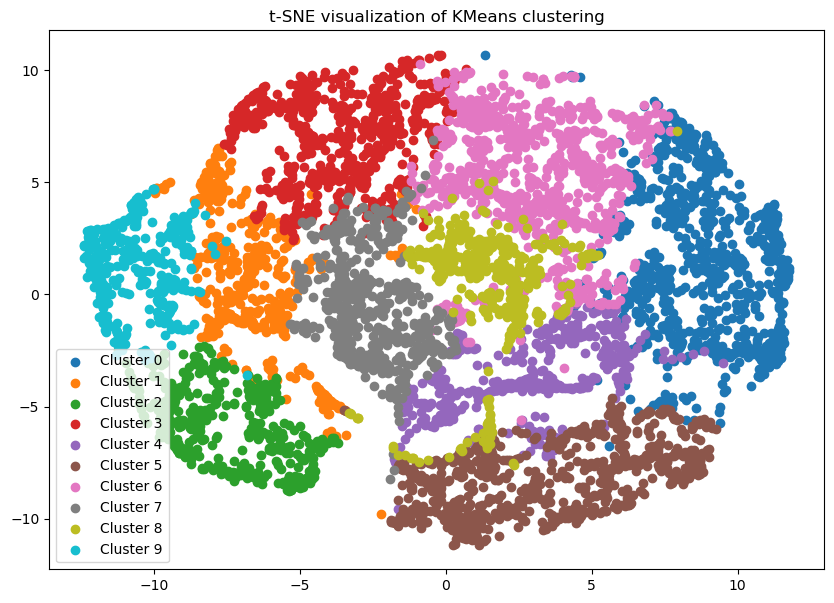

In [ ]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications.inception_v3 import preprocess_input
import pickle
from sklearn.cluster import KMeans
from sklearn.preprocessing import normalize

# Function to read and preprocess image
def read_image(image_path, target_shape=(128, 128)):
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError(f"Unable to read image at {image_path}")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, target_shape)
    image = preprocess_input(image)
    return np.expand_dims(image, axis=0)

# Load known encodings
ENCODINGS_FILE = "known_faces_encodingsFinal.pkl"
with open(ENCODINGS_FILE, 'rb') as f:
    known_encodings = pickle.load(f)

X = []
labels = []

for known_name, (known_encoding, known_label) in known_encodings.items():
    X.append(known_encoding.flatten())
    labels.append(known_label)

X = normalize(X)

# Perform KMeans clustering
kmeans = KMeans(n_clusters=10, random_state=0)
kmeans.fit(X)
clusters = kmeans.labels_

# Save the clustering results
clustered_encodings = {label: [] for label in set(clusters)}
for i, label in enumerate(labels):
    clustered_encodings[clusters[i]].append((X[i], label))

# Visualize the clustering using t-SNE
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Reduce the dimensions to 2D using t-SNE
tsne = TSNE(n_components=2, perplexity=30, n_iter=300)
X_2d = tsne.fit_transform(X)

# Plot the clusters
plt.figure(figsize=(10, 7))
for cluster in set(clusters):
    indices = [i for i, c in enumerate(clusters) if c == cluster]
    points = X_2d[indices]
    plt.scatter(points[:, 0], points[:, 1], label=f'Cluster {cluster}')

plt.legend()
plt.title("t-SNE visualization of KMeans clustering")
plt.show()


c:\ProgramData\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


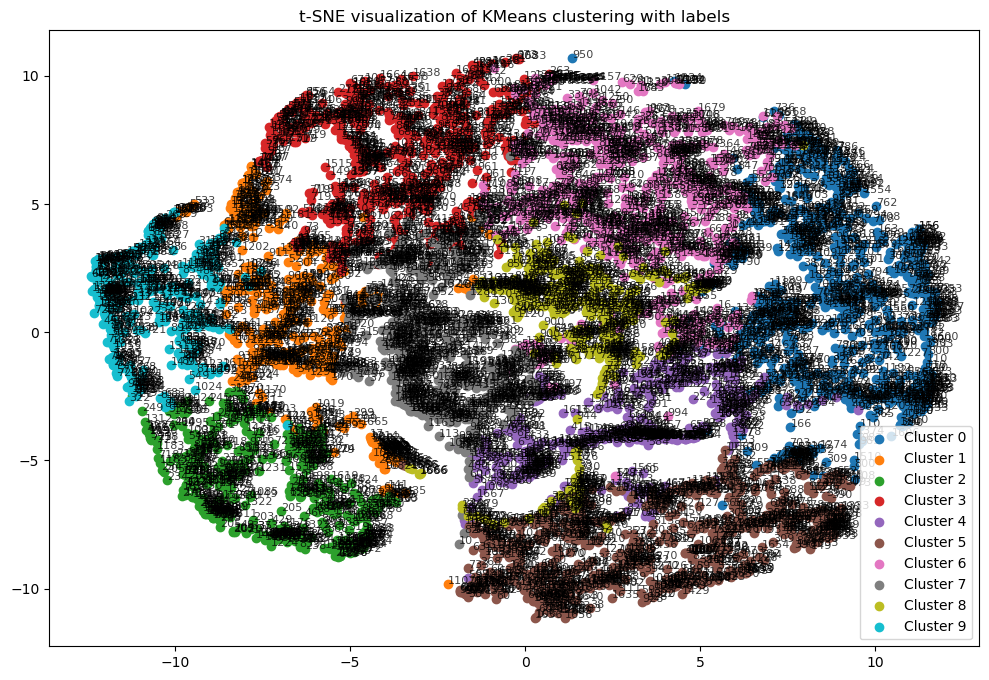

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


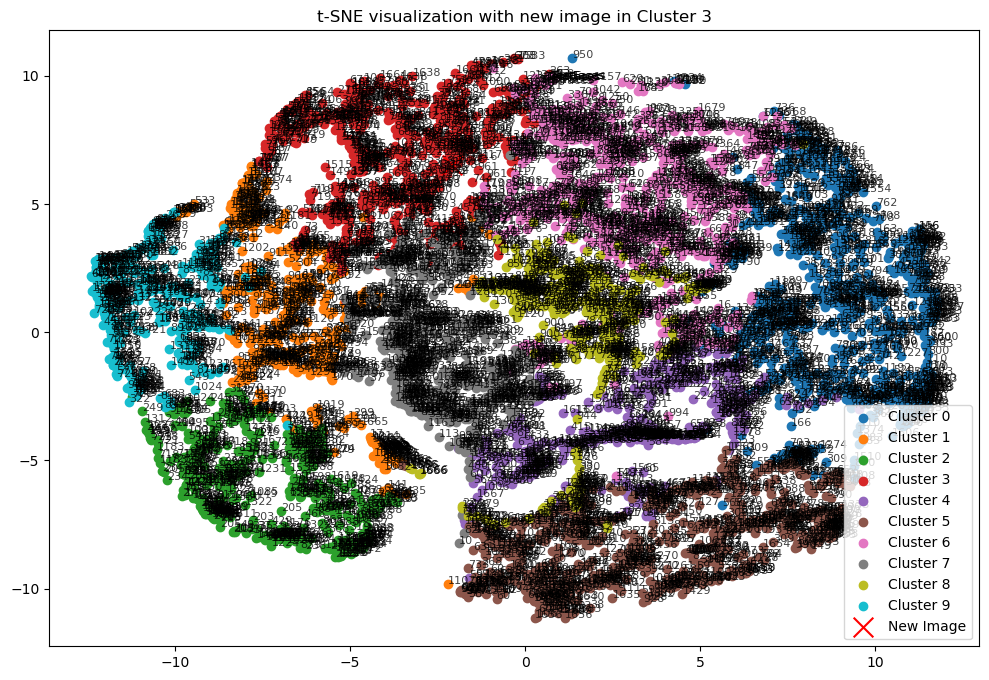

The predicted label for the image is: TestFaces


In [ ]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications.inception_v3 import preprocess_input
import pickle
from sklearn.cluster import KMeans
from sklearn.preprocessing import normalize
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from collections import Counter

# Function to read and preprocess image
def read_image(image_path, target_shape=(128, 128)):
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError(f"Unable to read image at {image_path}")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, target_shape)
    image = preprocess_input(image)
    return np.expand_dims(image, axis=0)

# Load known encodings
ENCODINGS_FILE = "known_faces_encodingsFinal.pkl"
with open(ENCODINGS_FILE, 'rb') as f:
    known_encodings = pickle.load(f)

X = []
labels = []

for known_name, (known_encoding, known_label) in known_encodings.items():
    X.append(known_encoding.flatten())
    labels.append(known_label)

X = normalize(X)

# Perform KMeans clustering
kmeans = KMeans(n_clusters=10, random_state=0)
kmeans.fit(X)
clusters = kmeans.labels_

# Reduce the dimensions to 2D using t-SNE
tsne = TSNE(n_components=2, perplexity=30, n_iter=300)
X_2d = tsne.fit_transform(X)

# Plot the clusters with labels
plt.figure(figsize=(12, 8))
for cluster in set(clusters):
    indices = [i for i, c in enumerate(clusters) if c == cluster]
    points = X_2d[indices]
    plt.scatter(points[:, 0], points[:, 1], label=f'Cluster {cluster}')

# Add labels to the plot
for i, label in enumerate(labels):
    plt.annotate(label, (X_2d[i, 0], X_2d[i, 1]), fontsize=8, alpha=0.75)

plt.legend()
plt.title("t-SNE visualization of KMeans clustering with labels")
plt.show()

# Function to classify a single image and visualize its cluster
def classify_and_visualize(encoder_model, image_path, kmeans, X, X_2d, labels):
    # Read and preprocess the image
    image = read_image(image_path)
    
    # Generate encoding for the image
    encoding = encoder_model.predict(image).flatten()
    normalized_encoding = normalize([encoding])[0]
    
    # Predict the cluster
    cluster = kmeans.predict([normalized_encoding])[0]
    
    # Combine the new image's encoding with the existing ones
    X_combined = np.vstack([X, normalized_encoding])
    
    # Reduce the dimensions to 2D using t-SNE
    tsne_combined = TSNE(n_components=2, perplexity=30, n_iter=300)
    X_2d_combined = tsne_combined.fit_transform(X_combined)
    
    # Visualize the cluster
    plt.figure(figsize=(12, 8))
    for c in set(clusters):
        indices = [i for i, cl in enumerate(clusters) if cl == c]
        points = X_2d_combined[indices]
        plt.scatter(points[:, 0], points[:, 1], label=f'Cluster {c}')
    
    # Add labels to the plot
    for i, label in enumerate(labels):
        plt.annotate(label, (X_2d_combined[i, 0], X_2d_combined[i, 1]), fontsize=8, alpha=0.75)
    
    # Plot the new image's point
    new_point_2d = X_2d_combined[-1]
    plt.scatter(new_point_2d[0], new_point_2d[1], color='red', marker='x', s=200, label='New Image')
    plt.legend()
    plt.title(f"t-SNE visualization with new image in Cluster {cluster}")
    plt.show()
    
    # Determine the label of the majority class in the cluster
    cluster_indices = [i for i, c in enumerate(clusters) if c == cluster]
    cluster_labels = [labels[i] for i in cluster_indices]
    most_common_label = Counter(cluster_labels).most_common(1)[0][0]
    
    return most_common_label

# Load the model
weights_path = "siamese_model-final-Vladington2.weights.h5"
siamese_model = load_siamese_model(weights_path)
encoder_model = siamese_model.siamese_network.get_layer('Encode_Model')

# Path to a single image for classification
single_image_path = "/Users/pavlovichv/Desktop/Extracted Faces/Extracted Faces/1678/3.jpg"

# Classify the single image and visualize the cluster
predicted_label = classify_and_visualize(encoder_model, single_image_path, kmeans, X, X_2d, labels)
print(f"The predicted label for the image is: {predicted_label}")


check encoding structure

In [ ]:
# Load known encodings
ENCODINGS_FILE = "known_faces_encodingsFinal.pkl"
with open(ENCODINGS_FILE, 'rb') as f:
    known_encodings = pickle.load(f)

# Print the detailed structure of known encodings
for key, value in known_encodings.items():
    print(f"Key: {key}")
    print(f"Type of Value: {type(value)}")
    if isinstance(value, tuple):
        for i, item in enumerate(value):
            print(f"  Item {i}: Type: {type(item)}, Shape: {item.shape if isinstance(item, np.ndarray) else 'Not a numpy array'}")
    else:
        print(f"Value Shape: {value.shape if isinstance(value, np.ndarray) else 'Not a numpy array'}")
    break  # Remove this break if you want to see the structure for all items


Key: /Users/pavlovichv/Desktop/Extracted Faces/Extracted Faces\0\0.jpg
Type of Value: <class 'tuple'>
  Item 0: Type: <class 'numpy.ndarray'>, Shape: (1, 128)
  Item 1: Type: <class 'str'>, Shape: Not a numpy array


In [ ]:
import os
import uuid
import cv2
import numpy as np
import tensorflow as tf

def data_aug(img):
    # Generate one augmented image
    img_aug = tf.image.stateless_random_brightness(img, max_delta=0.02, seed=(1, 2))
    img_aug = tf.image.stateless_random_contrast(img_aug, lower=0.6, upper =1, seed=(1, 3))
    img_aug = tf.image.stateless_random_flip_left_right(img_aug, seed=(np.random.randint(100), np.random.randint(100)))
    img_aug = tf.image.stateless_random_jpeg_quality(img_aug, min_jpeg_quality=90, max_jpeg_quality=100, seed=(np.random.randint(100), np.random.randint(100)))
    img_aug = tf.image.stateless_random_saturation(img_aug, lower=0.9, upper=1, seed=(np.random.randint(100), np.random.randint(100)))
    return img_aug

def augment_images(directory, num_augments=10):
    for root, _, files in os.walk(directory):
        for file_name in files:
            img_path = os.path.join(root, file_name)
            print(f"Reading image: {img_path}")
            img = cv2.imread(img_path)
            if img is not None:
                print(f"Image loaded successfully: {img_path}")
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                img = tf.convert_to_tensor(img, dtype=tf.float32) / 255.0  # Normalize the image
                for i in range(num_augments):
                    augmented_image = data_aug(img)  # Generate augmented images
                    save_path = os.path.join(root, f"{uuid.uuid4().hex}.jpg")
                    image_np = np.clip(augmented_image.numpy() * 255, 0, 255).astype(np.uint8)
                    success = cv2.imwrite(save_path, cv2.cvtColor(image_np, cv2.COLOR_RGB2BGR))
                    if success:
                        print(f"Saved augmented image to: {save_path}")
                    else:
                        print(f"Failed to save augmented image to: {save_path}")
            else:
                print(f"Failed to load image: {img_path}")

# Adjust this path to point to your directory
DIRECTORY_PATH = '/Users/pavlovichv/Desktop/Extracted Faces/Extracted Faces/TestFaces'

print("Starting data augmentation for images...")
augment_images(DIRECTORY_PATH)


Starting data augmentation for images...
Reading image: /Users/pavlovichv/Desktop/Extracted Faces/Extracted Faces/TestFaces\59fdYjvoYU-Tp56VlBParA_Epvqc451rWh4SUmoHAT0_face_2.jpg
Image loaded successfully: /Users/pavlovichv/Desktop/Extracted Faces/Extracted Faces/TestFaces\59fdYjvoYU-Tp56VlBParA_Epvqc451rWh4SUmoHAT0_face_2.jpg
Saved augmented image to: /Users/pavlovichv/Desktop/Extracted Faces/Extracted Faces/TestFaces\5de8b65a45704bb491a301d96650cb0b.jpg
Saved augmented image to: /Users/pavlovichv/Desktop/Extracted Faces/Extracted Faces/TestFaces\262a81f13ef245b6b236f70fe6ff0cf5.jpg
Saved augmented image to: /Users/pavlovichv/Desktop/Extracted Faces/Extracted Faces/TestFaces\9bf56e8a96d44e7393e03916a4e2b769.jpg
Saved augmented image to: /Users/pavlovichv/Desktop/Extracted Faces/Extracted Faces/TestFaces\4b10bbfaa117415baf77f136fd3dccc1.jpg
Saved augmented image to: /Users/pavlovichv/Desktop/Extracted Faces/Extracted Faces/TestFaces\a43ee76f2f924f4d9029f56bfeeb78df.jpg
Saved augmented 

Reduced Layers

Number of training triplets: 8287
Number of testing triplets: 2989
Total triplets: 11276

Examples of triplets:
(('143', '0.jpg'), ('143', '4.jpg'), ('957', '0.jpg'))
(('329', '2.jpg'), ('329', '3.jpg'), ('40', '3.jpg'))
(('409', '12.jpg'), ('409', '5.jpg'), ('739', '0.jpg'))
(('531', '12.jpg'), ('531', '14.jpg'), ('293', '1.jpg'))
(('480', '0.jpg'), ('480', '2.jpg'), ('1221', '3.jpg'))


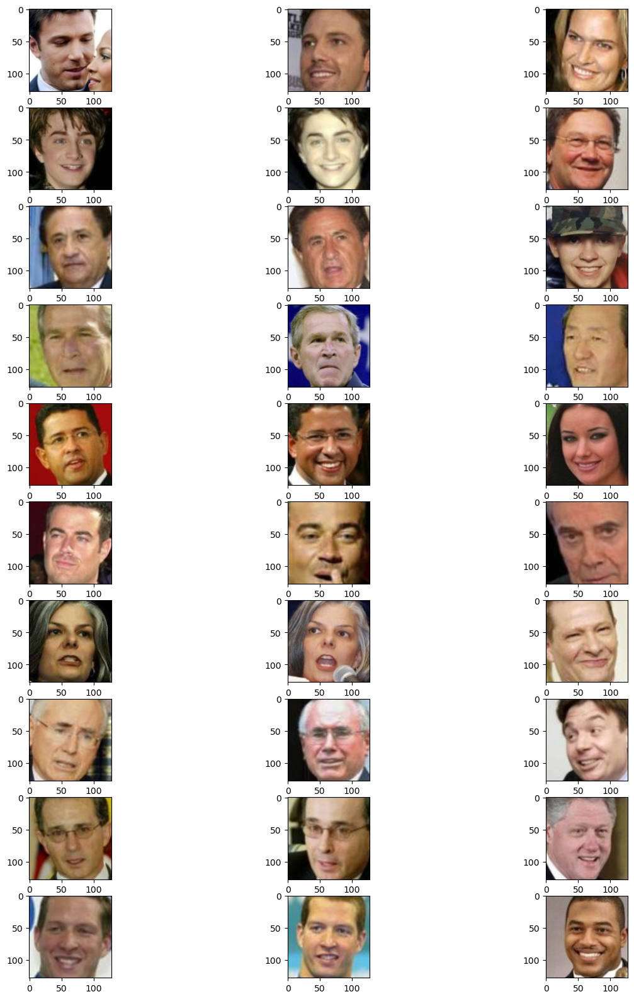

Epoch 1/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - loss: 0.7261Accuracy on test = 0.84545
Epoch 1: Accuracy on test = 0.84545, Loss = 0.61796, Val Loss = 0.47318, AP Mean = 0.37265, AN Mean = 1.22599
64/64 ━━━━━━━━━━━━━━━━━━━━ 442s 7s/step - loss: 0.7244 - val_loss: 0.4732 - learning_rate: 1.0000e-04
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - loss: 0.4700Accuracy on test = 0.87500
Epoch 2: Accuracy on test = 0.87500, Loss = 0.46036, Val Loss = 0.42727, AP Mean = 0.37910, AN Mean = 1.25968
64/64 ━━━━━━━━━━━━━━━━━━━━ 417s 7s/step - loss: 0.4698 - val_loss: 0.4273 - learning_rate: 1.0000e-04
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - loss: 0.3941Accuracy on test = 0.88893
Epoch 3: Accuracy on test = 0.88893, Loss = 0.38642, Val Loss = 0.39596, AP Mean = 0.41745, AN Mean = 1.41060
64/64 ━━━━━━━━━━━━━━━━━━━━ 427s 7s/step - loss: 0.3940 - val_loss: 0.3960 - learning_rate: 1.0000e-04
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - loss: 0.3443Accuracy on test = 0.90014


In [ ]:
import os
import cv2
import random
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.applications.inception_v3 import preprocess_input
import tensorflow as tf
from tensorflow.keras import layers, metrics, Model
from tensorflow.keras.applications import Xception
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, LearningRateScheduler
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import datetime

# Set random seeds for consistency
random.seed(5)
np.random.seed(5)
tf.random.set_seed(5)

# Directories
ROOT = "/Users/pavlovichv/Desktop/Extracted Faces/Extracted Faces"
TARGET_SHAPE = (128, 128)  # Target shape for resizing images

def read_image(directory, folder, image_name):
    path = os.path.join(directory, folder, image_name)
    image = cv2.imread(path)
    if image is None:
        raise ValueError(f"Unable to read image at {path}")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, TARGET_SHAPE)
    return image

def split_dataset(directory, split=0.7):
    folders = [f for f in os.listdir(directory) if os.path.isdir(os.path.join(directory, f))]
    num_train = int(len(folders) * split)
  
    random.shuffle(folders)
  
    train_list = {folder: len(os.listdir(os.path.join(directory, folder))) for folder in folders[:num_train]}
    test_list = {folder: len(os.listdir(os.path.join(directory, folder))) for folder in folders[num_train:]}
  
    return train_list, test_list

def create_triplets(directory, folder_list, max_files=10):
    triplets = []
    folders = list(folder_list.keys())
  
    for folder in folders:
        path = os.path.join(directory, folder)
        files = [f for f in os.listdir(path) if os.path.isfile(os.path.join(path, f))][:max_files]
        num_files = len(files)
      
        for i in range(num_files - 1):
            for j in range(i + 1, num_files):
                anchor = (folder, files[i])
                positive = (folder, files[j])

                neg_folder = folder
                while neg_folder == folder:
                    neg_folder = random.choice(folders)
                neg_files = [f for f in os.listdir(os.path.join(directory, neg_folder)) if os.path.isfile(os.path.join(directory, neg_folder, f))]
                negative = (neg_folder, random.choice(neg_files))

                triplets.append((anchor, positive, negative))
  
    random.shuffle(triplets)
    return triplets

# Split the dataset
train_list, test_list = split_dataset(ROOT, split=0.7)

# Create triplets
train_triplet = create_triplets(ROOT, train_list)
test_triplet = create_triplets(ROOT, test_list)

print("Number of training triplets:", len(train_triplet))
print("Number of testing triplets:", len(test_triplet))
print("Total triplets:", len(train_triplet) + len(test_triplet))

print("\nExamples of triplets:")
for i in range(5):
    print(train_triplet[i])

def augment_image(image):
    datagen = ImageDataGenerator(
        rotation_range=30,
        width_shift_range=0.3,
        height_shift_range=0.3,
        shear_range=0.3,
        zoom_range=0.3,
        horizontal_flip=True,
        fill_mode='nearest'
    )
    image = image.reshape((1,) + image.shape)  # Reshape image to (1, height, width, channels)
    iterator = datagen.flow(image, batch_size=1)
    augmented_image = next(iterator)[0]  # Use next(iterator) to get the augmented image
    return augmented_image

def get_batch(triplet_list, batch_size=64, preprocess=True, augment=False):
    batch_steps = max(1, len(triplet_list) // batch_size)  # Ensure at least 1 step per epoch
  
    for i in range(batch_steps):
        anchor = []
        positive = []
        negative = []
      
        j = i * batch_size
        while j < (i + 1) * batch_size and j < len(triplet_list):
            a, p, n = triplet_list[j]
            a_img = read_image(ROOT, a[0], a[1])
            p_img = read_image(ROOT, p[0], p[1])
            n_img = read_image(ROOT, n[0], n[1])
          
            if augment:
                a_img = augment_image(a_img)
                p_img = augment_image(p_img)
                n_img = augment_image(n_img)
              
            if a_img is not None and p_img is not None and n_img is not None:
                anchor.append(a_img)
                positive.append(p_img)
                negative.append(n_img)
            j += 1
      
        anchor = np.array(anchor)
        positive = np.array(positive)
        negative = np.array(negative)
      
        if preprocess:
            anchor = preprocess_input(anchor)
            positive = preprocess_input(positive)
            negative = preprocess_input(negative)
      
        yield (anchor, positive, negative)

# Visualization
num_plots = 10
f, axes = plt.subplots(num_plots, 3, figsize=(15, 20))

for x in get_batch(train_triplet, batch_size=num_plots, preprocess=False):
    a, p, n = x
    for i in range(num_plots):
        axes[i, 0].imshow(a[i])
        axes[i, 1].imshow(p[i])
        axes[i, 2].imshow(n[i])
    break

plt.show()

# Define the Encoder
def get_encoder(input_shape):
    """ Returns the image encoding model """
    pretrained_model = Xception(
        input_shape=input_shape,
        weights='imagenet',
        include_top=False,
        pooling='avg',
    )
  
    for layer in pretrained_model.layers[-30:]:  # Unfreeze the last 30 layers for fine-tuning
        layer.trainable = True

    inputs = layers.Input(shape=input_shape)
    x = pretrained_model(inputs, training=False)
    x = layers.Flatten()(x)
    x = layers.Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.Lambda(lambda x: tf.math.l2_normalize(x, axis=1))(x)
    return Model(inputs, x, name="Encode_Model")

# Define the Distance Layer
class DistanceLayer(layers.Layer):
    # A layer to compute ‖f(A) - f(P)‖² and ‖f(A) - f(N)‖²
    def __init__(self, **kwargs):
        super().__init__(**kwargs)

    def call(self, anchor, positive, negative):
        ap_distance = tf.reduce_sum(tf.square(anchor - positive), -1)
        an_distance = tf.reduce_sum(tf.square(anchor - negative), -1)
        return (ap_distance, an_distance)

# Define the Siamese Network
def get_siamese_network(input_shape=(128, 128, 3)):
    encoder = get_encoder(input_shape)
  
    # Input Layers for the images
    anchor_input   = layers.Input(input_shape, name="Anchor_Input")
    positive_input = layers.Input(input_shape, name="Positive_Input")
    negative_input = layers.Input(input_shape, name="Negative_Input")
  
    # Generate the encodings (feature vectors) for the images
    encoded_a = encoder(anchor_input)
    encoded_p = encoder(positive_input)
    encoded_n = encoder(negative_input)
  
    # A layer to compute ‖f(A) - f(P)‖² and ‖f(A) - f(N)‖²
    distances = DistanceLayer()(
        encoded_a,
        encoded_p,
        encoded_n
    )
  
    # Creating the Model
    siamese_network = Model(
        inputs  = [anchor_input, positive_input, negative_input],
        outputs = distances,
        name = "Siamese_Network"
    )
    return siamese_network

# Define Custom Triplet Loss
class TripletLoss(tf.keras.losses.Loss):
    def __init__(self, margin=1.0, name='triplet_loss'):
        super().__init__(name=name)
        self.margin = margin

    def call(self, y_true, y_pred):
        ap_distance, an_distance = y_pred
        loss = tf.maximum(ap_distance - an_distance + self.margin, 0.0)
        return tf.reduce_mean(loss)

# Define the SiameseModel with custom training and testing steps
class SiameseModel(Model):
    def __init__(self, siamese_network, margin=1.0):
        super(SiameseModel, self).__init__()
        self.margin = margin
        self.siamese_network = siamese_network
        self.loss_tracker = metrics.Mean(name="loss")
        self.triplet_loss = TripletLoss(margin=margin)

    def call(self, inputs):
        return self.siamese_network(inputs)

    def train_step(self, data):
        anchor, positive, negative = data
        dummy_y_true = tf.ones((tf.shape(anchor)[0], 1))  # Create a dummy tensor for y_true
        with tf.GradientTape() as tape:
            ap_distance, an_distance = self.siamese_network([anchor, positive, negative])
            loss = self.triplet_loss(dummy_y_true, (ap_distance, an_distance))
        
        gradients = tape.gradient(loss, self.siamese_network.trainable_weights)
        self.optimizer.apply_gradients(zip(gradients, self.siamese_network.trainable_weights))
        
        self.loss_tracker.update_state(loss)
        return {"loss": self.loss_tracker.result()}

    def test_step(self, data):
        anchor, positive, negative = data
        dummy_y_true = tf.ones((tf.shape(anchor)[0], 1))  # Create a dummy tensor for y_true
        ap_distance, an_distance = self.siamese_network([anchor, positive, negative])
        loss = self.triplet_loss(dummy_y_true, (ap_distance, an_distance))
        
        self.loss_tracker.update_state(loss)
        return {"loss": self.loss_tracker.result()}

    @property
    def metrics(self):
        return [self.loss_tracker]

# Compile the model
input_shape = (128, 128, 3)
siamese_network = get_siamese_network(input_shape)
siamese_model = SiameseModel(siamese_network, margin=1.0)

# Replace optimizer with the standard Adam optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)  # Adjusted learning rate
siamese_model.compile(optimizer=optimizer)

# Add callbacks
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=5,
    min_lr=1e-7,
    verbose=1
)

early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True,
    verbose=1
)

def scheduler(epoch, lr):
    if epoch < 10:
        return float(lr)
    else:
        return float(lr * tf.math.exp(-0.1))

lr_scheduler = LearningRateScheduler(scheduler)

# TensorBoard for better visualization
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

# Convert batches to dataset
def batch_to_dataset(triplets, batch_size):
    def generator():
        for batch in get_batch(triplets, batch_size=batch_size, preprocess=True, augment=True):  # Enable augmentation
            yield batch
  
    return tf.data.Dataset.from_generator(generator, output_signature=(
        (tf.TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32),
         tf.TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32),
         tf.TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32))
    )).repeat()  # Ensure the dataset repeats

# Convert training and testing triplets to datasets
batch_size = 128  # Increase the batch size
train_dataset = batch_to_dataset(train_triplet, batch_size=batch_size)
test_dataset = batch_to_dataset(test_triplet, batch_size=batch_size)

# Calculate steps per epoch
steps_per_epoch = max(1, len(train_triplet) // batch_size)
validation_steps = max(1, len(test_triplet) // batch_size)

# Testing the model
def test_on_triplets(batch_size=128):
    pos_scores = []
    neg_scores = []

    for data in get_batch(test_triplet, batch_size=batch_size):
        anchor, positive, negative = data
        prediction = siamese_model([anchor, positive, negative])
        pos_scores += list(prediction[0].numpy())  # Convert tensor to numpy
        neg_scores += list(prediction[1].numpy())  # Convert tensor to numpy
  
    accuracy = np.sum(np.array(pos_scores) < np.array(neg_scores)) / len(pos_scores)
    ap_mean = np.mean(pos_scores)
    an_mean = np.mean(neg_scores)
    ap_stds = np.std(pos_scores)
    an_stds = np.std(neg_scores)
  
    print(f"Accuracy on test = {accuracy:.5f}")
    return (accuracy, ap_mean, an_mean, ap_stds, an_stds)

# Custom callback for accuracy calculation
class AccuracyCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        test_results = test_on_triplets(batch_size=128)
        print(f"Epoch {epoch + 1}: Accuracy on test = {test_results[0]:.5f}, "
              f"Loss = {logs['loss']:.5f}, Val Loss = {logs['val_loss']:.5f}, "
              f"AP Mean = {test_results[1]:.5f}, AN Mean = {test_results[2]:.5f}")

accuracy_callback = AccuracyCallback()

# Training the Model using fit
history = siamese_model.fit(
    train_dataset,
    epochs=100,
    validation_data=test_dataset,
    callbacks=[reduce_lr, early_stopping, accuracy_callback, tensorboard_callback, lr_scheduler],
    steps_per_epoch=steps_per_epoch,
    validation_steps=validation_steps
)

# Saving the model after all epochs run
siamese_model.save_weights("siamese_model-final-Vladington4.weights.h5")

# Final test results
test_results = test_on_triplets(batch_size=128)
print(f"Test results: {test_results}")


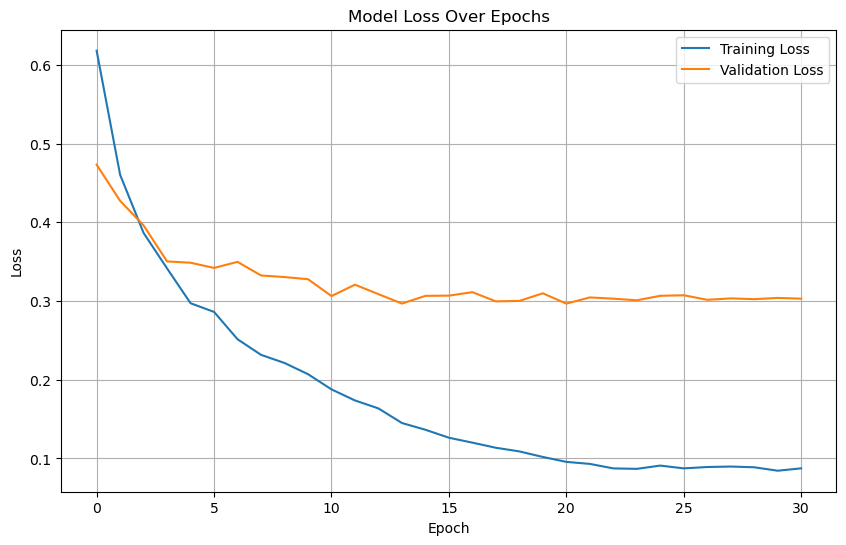

In [ ]:
import matplotlib.pyplot as plt

# Assuming 'history' is the variable storing the training history from model.fit()
def plot_loss(history):
    plt.figure(figsize=(10, 6))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss Over Epochs')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend(loc='upper right')
    plt.grid(True)
    plt.show()

# Plot the loss
plot_loss(history)


In [ ]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications.inception_v3 import preprocess_input
import pickle
from collections import defaultdict

# Set random seeds for consistency
random.seed(5)
np.random.seed(5)
tf.random.set_seed(5)

# Directories
ROOT = "/Users/pavlovichv/Desktop/Extracted Faces/Extracted Faces"
ENCODINGS_FILE = "UpdateEncodings.pkl"
TARGET_SHAPE = (128, 128)  # Target shape for resizing images

# Function to read and preprocess image
def read_image(image_path, target_shape=TARGET_SHAPE):
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError(f"Unable to read image at {image_path}")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, target_shape)
    image = preprocess_input(image)
    return image

# Load the Siamese model
def load_siamese_model(weights_path):
    input_shape = (128, 128, 3)
    siamese_network = get_siamese_network(input_shape)
    siamese_model = SiameseModel(siamese_network, margin=1.0)

    # Dummy data to build the model
    dummy_data = [
        np.random.random((1, 128, 128, 3)),
        np.random.random((1, 128, 128, 3)),
        np.random.random((1, 128, 128, 3))
    ]
    siamese_model(dummy_data)

    # Load the trained model weights
    siamese_model.load_weights(weights_path)
    return siamese_model

# Function to get image files and their labels
def get_image_files_and_labels(directory):
    image_files = defaultdict(list)
    for subdir, dirs, files in os.walk(directory):
        label = os.path.basename(subdir)
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg')):
                image_files[label].append(os.path.join(subdir, file))
    return image_files

# Function to save encodings with labels
def save_encodings_with_labels(model, image_files, encoding_file):
    encodings = {}
    for label, files in image_files.items():
        for file in files:
            image = read_image(file)
            image = np.expand_dims(image, axis=0)
            encoding = model.predict(image)
            encodings[file] = (encoding, label)
    with open(encoding_file, 'wb') as f:
        pickle.dump(encodings, f)

# Load the model
weights_path = "siamese_model-final-Vladington4.weights.h5"
siamese_model = load_siamese_model(weights_path)
encoder_model = siamese_model.siamese_network.get_layer('Encode_Model')

# Get image files and their labels
image_files = get_image_files_and_labels(ROOT)

# Save encodings with labels
save_encodings_with_labels(encoder_model, image_files, ENCODINGS_FILE)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━

In [ ]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications.inception_v3 import preprocess_input
from sklearn.metrics.pairwise import cosine_similarity
import pickle

# Function to read and preprocess image
def read_image(image_path, target_shape=(128, 128)):
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError(f"Unable to read image at {image_path}")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, target_shape)
    image = preprocess_input(image)
    return np.expand_dims(image, axis=0)

# Function to classify a single image using known encodings
def classify_single_image(encoder_model, image_path, known_encodings, threshold=0.5):
    # Read and preprocess the image
    image = read_image(image_path)
    
    # Generate encoding for the image
    encoding = encoder_model.predict(image)
    
    best_match = None
    highest_similarity = -1
    for known_name, (known_encoding, known_label) in known_encodings.items():
        similarity = cosine_similarity(encoding, known_encoding)
        if similarity > highest_similarity:
            highest_similarity = similarity
            best_match = known_label

    if highest_similarity < threshold:
        return "Unknown", highest_similarity
    return best_match, highest_similarity

# Load known encodings
ENCODINGS_FILE = "UpdateEncodings.pkl"
with open(ENCODINGS_FILE, 'rb') as f:
    known_encodings = pickle.load(f)

# Load the model
weights_path = "siamese_model-final-Vladington4.weights.h5"
siamese_model = load_siamese_model(weights_path)
encoder_model = siamese_model.siamese_network.get_layer('Encode_Model')

# Path to a single image for classification
single_image_path = "/Users/pavlovichv/Desktop/TestImages/Steph_Curry_P20230117AS-1347_(cropped)_face_1.jpg"

# Classify the single image
predicted_label, similarity = classify_single_image(encoder_model, single_image_path, known_encodings)
print(f"Predicted label for the image is: {predicted_label}")
print(f"Similarity: {similarity}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step
Predicted label for the image is: 1050
Similarity: [[0.95231026]]


In [ ]:
FaceNet

Number of training triplets: 8287
Number of testing triplets: 2989
Total triplets: 11276

Examples of triplets:
(('143', '0.jpg'), ('143', '4.jpg'), ('957', '0.jpg'))
(('329', '2.jpg'), ('329', '3.jpg'), ('40', '3.jpg'))
(('409', '12.jpg'), ('409', '5.jpg'), ('739', '0.jpg'))
(('531', '12.jpg'), ('531', '14.jpg'), ('293', '1.jpg'))
(('480', '0.jpg'), ('480', '2.jpg'), ('1221', '3.jpg'))


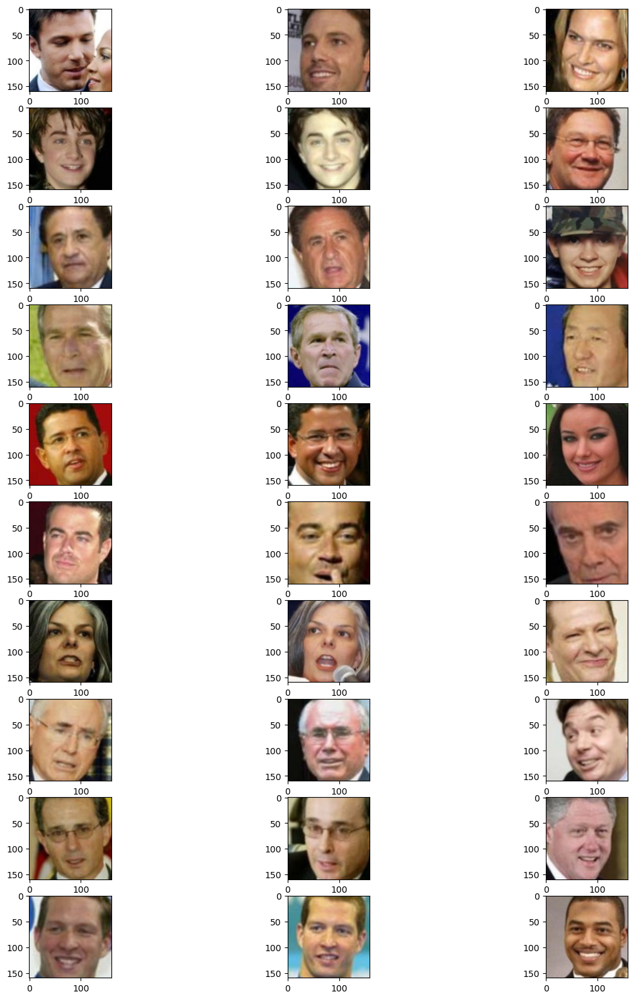

Epoch 1/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - loss: 0.5268Accuracy on test = 0.98505
Epoch 1: Accuracy on test = 0.98505, Loss = 0.42419, Val Loss = 0.37903, AP Mean = 0.57039, AN Mean = 1.51310
64/64 ━━━━━━━━━━━━━━━━━━━━ 235s 4s/step - loss: 0.5252 - val_loss: 0.3790 - learning_rate: 1.0000e-04
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - loss: 0.2589Accuracy on test = 0.98505
Epoch 2: Accuracy on test = 0.98505, Loss = 0.24120, Val Loss = 0.32195, AP Mean = 0.53644, AN Mean = 1.59034
64/64 ━━━━━━━━━━━━━━━━━━━━ 205s 3s/step - loss: 0.2586 - val_loss: 0.3219 - learning_rate: 1.0000e-04
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - loss: 0.1912Accuracy on test = 0.98539
Epoch 3: Accuracy on test = 0.98539, Loss = 0.18743, Val Loss = 0.29903, AP Mean = 0.52451, AN Mean = 1.62016
64/64 ━━━━━━━━━━━━━━━━━━━━ 203s 3s/step - loss: 0.1912 - val_loss: 0.2990 - learning_rate: 1.0000e-04
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - loss: 0.1686Accuracy on test = 0.98370


In [ ]:
import os
import cv2
import random
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers, metrics, Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, LearningRateScheduler
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import datetime
from keras_facenet import FaceNet

# Set random seeds for consistency
random.seed(5)
np.random.seed(5)
tf.random.set_seed(5)

# Directories
ROOT = "/Users/pavlovichv/Desktop/Extracted Faces/Extracted Faces"
TARGET_SHAPE = (160, 160)  # Target shape for resizing images

def read_image(directory, folder, image_name):
    path = os.path.join(directory, folder, image_name)
    image = cv2.imread(path)
    if image is None:
        raise ValueError(f"Unable to read image at {path}")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, TARGET_SHAPE)
    return image

def split_dataset(directory, split=0.7):
    folders = [f for f in os.listdir(directory) if os.path.isdir(os.path.join(directory, f))]
    num_train = int(len(folders) * split)
  
    random.shuffle(folders)
  
    train_list = {folder: len(os.listdir(os.path.join(directory, folder))) for folder in folders[:num_train]}
    test_list = {folder: len(os.listdir(os.path.join(directory, folder))) for folder in folders[num_train:]}
  
    return train_list, test_list

def create_triplets(directory, folder_list, max_files=10):
    triplets = []
    folders = list(folder_list.keys())
  
    for folder in folders:
        path = os.path.join(directory, folder)
        files = [f for f in os.listdir(path) if os.path.isfile(os.path.join(path, f))][:max_files]
        num_files = len(files)
      
        for i in range(num_files - 1):
            for j in range(i + 1, num_files):
                anchor = (folder, files[i])
                positive = (folder, files[j])

                neg_folder = folder
                while neg_folder == folder:
                    neg_folder = random.choice(folders)
                neg_files = [f for f in os.listdir(os.path.join(directory, neg_folder)) if os.path.isfile(os.path.join(directory, neg_folder, f))]
                negative = (neg_folder, random.choice(neg_files))

                triplets.append((anchor, positive, negative))
  
    random.shuffle(triplets)
    return triplets

# Split the dataset
train_list, test_list = split_dataset(ROOT, split=0.7)

# Create triplets
train_triplet = create_triplets(ROOT, train_list)
test_triplet = create_triplets(ROOT, test_list)

print("Number of training triplets:", len(train_triplet))
print("Number of testing triplets:", len(test_triplet))
print("Total triplets:", len(train_triplet) + len(test_triplet))

print("\nExamples of triplets:")
for i in range(5):
    print(train_triplet[i])

def augment_image(image):
    datagen = ImageDataGenerator(
        rotation_range=30,
        width_shift_range=0.3,
        height_shift_range=0.3,
        shear_range=0.3,
        zoom_range=0.3,
        horizontal_flip=True,
        fill_mode='nearest'
    )
    image = image.reshape((1,) + image.shape)  # Reshape image to (1, height, width, channels)
    iterator = datagen.flow(image, batch_size=1)
    augmented_image = next(iterator)[0]  # Use next(iterator) to get the augmented image
    return augmented_image

def get_batch(triplet_list, batch_size=64, preprocess=True, augment=False):
    batch_steps = max(1, len(triplet_list) // batch_size)  # Ensure at least 1 step per epoch
  
    for i in range(batch_steps):
        anchor = []
        positive = []
        negative = []
      
        j = i * batch_size
        while j < (i + 1) * batch_size and j < len(triplet_list):
            a, p, n = triplet_list[j]
            a_img = read_image(ROOT, a[0], a[1])
            p_img = read_image(ROOT, p[0], p[1])
            n_img = read_image(ROOT, n[0], n[1])
          
            if augment:
                a_img = augment_image(a_img)
                p_img = augment_image(p_img)
                n_img = augment_image(n_img)
              
            if a_img is not None and p_img is not None and n_img is not None:
                anchor.append(a_img)
                positive.append(p_img)
                negative.append(n_img)
            j += 1
      
        anchor = np.array(anchor)
        positive = np.array(positive)
        negative = np.array(negative)
      
        if preprocess:
            anchor = preprocess_input(anchor)
            positive = preprocess_input(positive)
            negative = preprocess_input(negative)
      
        yield (anchor, positive, negative)

# Visualization
num_plots = 10
f, axes = plt.subplots(num_plots, 3, figsize=(15, 20))

for x in get_batch(train_triplet, batch_size=num_plots, preprocess=False):
    a, p, n = x
    for i in range(num_plots):
        axes[i, 0].imshow(a[i])
        axes[i, 1].imshow(p[i])
        axes[i, 2].imshow(n[i])
    break

plt.show()

# Define the Encoder
def get_facenet_encoder(input_shape):
    facenet_model = FaceNet()
    facenet_model.model.trainable = False  # Freeze the FaceNet layers

    inputs = layers.Input(shape=input_shape)
    x = facenet_model.model(inputs)
    x = layers.Flatten()(x)
    x = layers.Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.Lambda(lambda x: tf.math.l2_normalize(x, axis=1))(x)
    return Model(inputs, x, name="Encode_Model")

# Define the Distance Layer
class DistanceLayer(layers.Layer):
    # A layer to compute ‖f(A) - f(P)‖² and ‖f(A) - f(N)‖²
    def __init__(self, **kwargs):
        super().__init__(**kwargs)

    def call(self, anchor, positive, negative):
        ap_distance = tf.reduce_sum(tf.square(anchor - positive), -1)
        an_distance = tf.reduce_sum(tf.square(anchor - negative), -1)
        return (ap_distance, an_distance)

# Define the Siamese Network
def get_siamese_network(input_shape=(160, 160, 3)):
    encoder = get_facenet_encoder(input_shape)
  
    # Input Layers for the images
    anchor_input   = layers.Input(input_shape, name="Anchor_Input")
    positive_input = layers.Input(input_shape, name="Positive_Input")
    negative_input = layers.Input(input_shape, name="Negative_Input")
  
    # Generate the encodings (feature vectors) for the images
    encoded_a = encoder(anchor_input)
    encoded_p = encoder(positive_input)
    encoded_n = encoder(negative_input)
  
    # A layer to compute ‖f(A) - f(P)‖² and ‖f(A) - f(N)‖²
    distances = DistanceLayer()(
        encoded_a,
        encoded_p,
        encoded_n
    )
  
    # Creating the Model
    siamese_network = Model(
        inputs  = [anchor_input, positive_input, negative_input],
        outputs = distances,
        name = "Siamese_Network"
    )
    return siamese_network

# Define Custom Triplet Loss
class TripletLoss(tf.keras.losses.Loss):
    def __init__(self, margin=1.0, name='triplet_loss'):
        super().__init__(name=name)
        self.margin = margin

    def call(self, y_true, y_pred):
        ap_distance, an_distance = y_pred
        loss = tf.maximum(ap_distance - an_distance + self.margin, 0.0)
        return tf.reduce_mean(loss)

# Define the SiameseModel with custom training and testing steps
class SiameseModel(Model):
    def __init__(self, siamese_network, margin=1.0):
        super(SiameseModel, self).__init__()
        self.margin = margin
        self.siamese_network = siamese_network
        self.loss_tracker = metrics.Mean(name="loss")
        self.triplet_loss = TripletLoss(margin=margin)

    def call(self, inputs):
        return self.siamese_network(inputs)

    def train_step(self, data):
        anchor, positive, negative = data
        dummy_y_true = tf.ones((tf.shape(anchor)[0], 1))  # Create a dummy tensor for y_true
        with tf.GradientTape() as tape:
            ap_distance, an_distance = self.siamese_network([anchor, positive, negative])
            loss = self.triplet_loss(dummy_y_true, (ap_distance, an_distance))
        
        gradients = tape.gradient(loss, self.siamese_network.trainable_weights)
        self.optimizer.apply_gradients(zip(gradients, self.siamese_network.trainable_weights))
        
        self.loss_tracker.update_state(loss)
        return {"loss": self.loss_tracker.result()}

    def test_step(self, data):
        anchor, positive, negative = data
        dummy_y_true = tf.ones((tf.shape(anchor)[0], 1))  # Create a dummy tensor for y_true
        ap_distance, an_distance = self.siamese_network([anchor, positive, negative])
        loss = self.triplet_loss(dummy_y_true, (ap_distance, an_distance))
        
        self.loss_tracker.update_state(loss)
        return {"loss": self.loss_tracker.result()}

    @property
    def metrics(self):
        return [self.loss_tracker]

# Compile the model
input_shape = (160, 160, 3)
siamese_network = get_siamese_network(input_shape)
siamese_model = SiameseModel(siamese_network, margin=1.0)

# Replace optimizer with the standard Adam optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)  # Adjusted learning rate
siamese_model.compile(optimizer=optimizer)

# Add callbacks
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=5,
    min_lr=1e-7,
    verbose=1
)

early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True,
    verbose=1
)

def scheduler(epoch, lr):
    if epoch < 10:
        return float(lr)
    else:
        return float(lr * tf.math.exp(-0.1))

lr_scheduler = LearningRateScheduler(scheduler)

# TensorBoard for better visualization
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

# Convert batches to dataset
def batch_to_dataset(triplets, batch_size):
    def generator():
        for batch in get_batch(triplets, batch_size=batch_size, preprocess=True, augment=True):  # Enable augmentation
            yield batch
  
    return tf.data.Dataset.from_generator(generator, output_signature=(
        (tf.TensorSpec(shape=(None, 160, 160, 3), dtype=tf.float32),
         tf.TensorSpec(shape=(None, 160, 160, 3), dtype=tf.float32),
         tf.TensorSpec(shape=(None, 160, 160, 3), dtype=tf.float32))
    )).repeat()  # Ensure the dataset repeats

# Convert training and testing triplets to datasets
batch_size = 128  # Increase the batch size
train_dataset = batch_to_dataset(train_triplet, batch_size=batch_size)
test_dataset = batch_to_dataset(test_triplet, batch_size=batch_size)

# Calculate steps per epoch
steps_per_epoch = max(1, len(train_triplet) // batch_size)
validation_steps = max(1, len(test_triplet) // batch_size)

# Testing the model
def test_on_triplets(batch_size=128):
    pos_scores = []
    neg_scores = []

    for data in get_batch(test_triplet, batch_size=batch_size):
        anchor, positive, negative = data
        prediction = siamese_model([anchor, positive, negative])
        pos_scores += list(prediction[0].numpy())  # Convert tensor to numpy
        neg_scores += list(prediction[1].numpy())  # Convert tensor to numpy
  
    accuracy = np.sum(np.array(pos_scores) < np.array(neg_scores)) / len(pos_scores)
    ap_mean = np.mean(pos_scores)
    an_mean = np.mean(neg_scores)
    ap_stds = np.std(pos_scores)
    an_stds = np.std(neg_scores)
  
    print(f"Accuracy on test = {accuracy:.5f}")
    return (accuracy, ap_mean, an_mean, ap_stds, an_stds)

# Custom callback for accuracy calculation
class AccuracyCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        test_results = test_on_triplets(batch_size=128)
        print(f"Epoch {epoch + 1}: Accuracy on test = {test_results[0]:.5f}, "
              f"Loss = {logs['loss']:.5f}, Val Loss = {logs['val_loss']:.5f}, "
              f"AP Mean = {test_results[1]:.5f}, AN Mean = {test_results[2]:.5f}")

accuracy_callback = AccuracyCallback()

# Training the Model using fit
history = siamese_model.fit(
    train_dataset,
    epochs=100,
    validation_data=test_dataset,
    callbacks=[reduce_lr, early_stopping, accuracy_callback, tensorboard_callback, lr_scheduler],
    steps_per_epoch=steps_per_epoch,
    validation_steps=validation_steps
)

# Saving the model after all epochs run
siamese_model.save_weights("facenet_siamese_model.weights.h5")

# Final test results
test_results = test_on_triplets(batch_size=128)
print(f"Test results: {test_results}")


In [ ]:
import os
import cv2
import numpy as np
import tensorflow as tf
import pickle
from keras_facenet import FaceNet
from tensorflow.keras import layers, Model

# Directories
ROOT = "/Users/pavlovichv/Desktop/Extracted Faces/Extracted Faces"
TARGET_SHAPE = (160, 160)  # Target shape for resizing images
ENCODINGS_FILE = "known_faceNet_encodings_final.pkl"
WEIGHTS_PATH = "facenet_siamese_model.weights.h5"

# Function to read and preprocess image
def read_image(image_path):
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError(f"Unable to read image at {image_path}")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, TARGET_SHAPE)
    return np.expand_dims(image, axis=0)

# Define the Encoder using FaceNet
def get_facenet_encoder(input_shape):
    facenet_model = FaceNet()
    facenet_model.model.trainable = False  # Freeze the FaceNet layers

    inputs = layers.Input(shape=input_shape)
    x = facenet_model.model(inputs)
    x = layers.Flatten()(x)
    x = layers.Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.Lambda(lambda x: tf.math.l2_normalize(x, axis=1))(x)
    return Model(inputs, x, name="FaceNet_Encode_Model")

# Define the Distance Layer
class DistanceLayer(layers.Layer):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)

    def call(self, anchor, positive, negative):
        ap_distance = tf.reduce_sum(tf.square(anchor - positive), -1)
        an_distance = tf.reduce_sum(tf.square(anchor - negative), -1)
        return (ap_distance, an_distance)

# Define the Siamese Network
def get_siamese_network(input_shape=(160, 160, 3)):
    encoder = get_facenet_encoder(input_shape)
  
    # Input Layers for the images
    anchor_input = layers.Input(input_shape, name="Anchor_Input")
    positive_input = layers.Input(input_shape, name="Positive_Input")
    negative_input = layers.Input(input_shape, name="Negative_Input")
  
    # Generate the encodings (feature vectors) for the images
    encoded_a = encoder(anchor_input)
    encoded_p = encoder(positive_input)
    encoded_n = encoder(negative_input)
  
    # A layer to compute ‖f(A) - f(P)‖² and ‖f(A) - f(N)‖²
    distances = DistanceLayer()(encoded_a, encoded_p, encoded_n)
  
    # Creating the Model
    siamese_network = Model(inputs=[anchor_input, positive_input, negative_input], outputs=distances, name="Siamese_Network")
    return siamese_network

# Define Custom Triplet Loss
class TripletLoss(tf.keras.losses.Loss):
    def __init__(self, margin=1.0, name='triplet_loss'):
        super().__init__(name=name)
        self.margin = margin

    def call(self, y_true, y_pred):
        ap_distance, an_distance = y_pred
        loss = tf.maximum(ap_distance - an_distance + self.margin, 0.0)
        return tf.reduce_mean(loss)

# Define the SiameseModel with custom training and testing steps
class SiameseModel(Model):
    def __init__(self, siamese_network, margin=1.0):
        super(SiameseModel, self).__init__()
        self.margin = margin
        self.siamese_network = siamese_network
        self.loss_tracker = metrics.Mean(name="loss")
        self.triplet_loss = TripletLoss(margin=margin)

    def call(self, inputs):
        return self.siamese_network(inputs)

# Load the trained Siamese model
def load_siamese_model(weights_path):
    input_shape = (160, 160, 3)
    siamese_network = get_siamese_network(input_shape)
    siamese_model = SiameseModel(siamese_network, margin=1.0)
    siamese_model.load_weights(weights_path)
    return siamese_model

siamese_model = load_siamese_model(WEIGHTS_PATH)
encoder_model = siamese_model.siamese_network.get_layer('FaceNet_Encode_Model')

# Function to generate and save encodings
def generate_and_save_encodings(directory, encoder_model, output_file):
    encodings = {}
    for root, _, files in os.walk(directory):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg')):
                image_path = os.path.join(root, file)
                image = read_image(image_path)
                encoding = encoder_model.predict(image).flatten()
                label = os.path.basename(root)
                encodings[image_path] = (encoding, label)
    
    with open(output_file, 'wb') as f:
        pickle.dump(encodings, f)
    print(f"Encodings saved to {output_file}")

# Generate and save encodings for all images in the dataset
generate_and_save_encodings(ROOT, encoder_model, ENCODINGS_FILE)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━

In [ ]:
import os
import cv2
import numpy as np
import tensorflow as tf
import pickle
from sklearn.metrics.pairwise import cosine_similarity
from keras_facenet import FaceNet
from tensorflow.keras import layers, Model

# Directories
TARGET_SHAPE = (160, 160)  # Target shape for resizing images
ENCODINGS_FILE = "known_faceNet_encodings_final.pkl"
WEIGHTS_PATH = "facenet_siamese_model.weights.h5"

# Function to read and preprocess image
def read_image(image_path):
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError(f"Unable to read image at {image_path}")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, TARGET_SHAPE)
    return np.expand_dims(image, axis=0)

# Load the trained Siamese model
def get_facenet_encoder(input_shape):
    facenet_model = FaceNet()
    facenet_model.model.trainable = False  # Freeze the FaceNet layers

    inputs = layers.Input(shape=input_shape)
    x = facenet_model.model(inputs)
    x = layers.Flatten()(x)
    x = layers.Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.Lambda(lambda x: tf.math.l2_normalize(x, axis=1))(x)
    return Model(inputs, x, name="FaceNet_Encode_Model")

# Load the trained Siamese model
def load_siamese_model(weights_path):
    input_shape = (160, 160, 3)
    siamese_network = get_siamese_network(input_shape)
    siamese_model = SiameseModel(siamese_network, margin=1.0)
    siamese_model.load_weights(weights_path)
    return siamese_model

# Function to get the siamese network
def get_siamese_network(input_shape=(160, 160, 3)):
    encoder = get_facenet_encoder(input_shape)
  
    # Input Layers for the images
    anchor_input   = layers.Input(input_shape, name="Anchor_Input")
    positive_input = layers.Input(input_shape, name="Positive_Input")
    negative_input = layers.Input(input_shape, name="Negative_Input")
  
    # Generate the encodings (feature vectors) for the images
    encoded_a = encoder(anchor_input)
    encoded_p = encoder(positive_input)
    encoded_n = encoder(negative_input)
  
    # A layer to compute ‖f(A) - f(P)‖² and ‖f(A) - f(N)‖²
    distances = DistanceLayer()(
        encoded_a,
        encoded_p,
        encoded_n
    )
  
    # Creating the Model
    siamese_network = Model(
        inputs  = [anchor_input, positive_input, negative_input],
        outputs = distances,
        name = "Siamese_Network"
    )
    return siamese_network

# Define Custom Triplet Loss
class TripletLoss(tf.keras.losses.Loss):
    def __init__(self, margin=1.0, name='triplet_loss'):
        super().__init__(name=name)
        self.margin = margin

    def call(self, y_true, y_pred):
        ap_distance, an_distance = y_pred
        loss = tf.maximum(ap_distance - an_distance + self.margin, 0.0)
        return tf.reduce_mean(loss)

# Define the SiameseModel with custom training and testing steps
class SiameseModel(Model):
    def __init__(self, siamese_network, margin=1.0):
        super(SiameseModel, self).__init__()
        self.margin = margin
        self.siamese_network = siamese_network
        self.loss_tracker = metrics.Mean(name="loss")
        self.triplet_loss = TripletLoss(margin=margin)

    def call(self, inputs):
        return self.siamese_network(inputs)

# Load known encodings
with open(ENCODINGS_FILE, 'rb') as f:
    known_encodings = pickle.load(f)

# Load the Siamese model
siamese_model = load_siamese_model(WEIGHTS_PATH)
encoder_model = siamese_model.siamese_network.get_layer('FaceNet_Encode_Model')

# Function to classify a single image using cosine similarity
def classify_single_image(image_path, encoder_model, known_encodings, threshold=0.5):
    image = read_image(image_path)
    encoding = encoder_model.predict(image).flatten()
    
    best_match = None
    highest_similarity = -1
    for known_path, (known_encoding, known_label) in known_encodings.items():
        similarity = cosine_similarity([encoding], [known_encoding])[0][0]
        if similarity > highest_similarity:
            highest_similarity = similarity
            best_match = known_label
    
    if highest_similarity < threshold:
        return "Unknown", highest_similarity
    return best_match, highest_similarity

# Path to a single image for classification
single_image_path = "/Users/pavlovichv/Desktop/TestImages/stephen-curry_face_1.jpg"

# Classify the single image
predicted_label, similarity = classify_single_image(single_image_path, encoder_model, known_encodings)
print(f"Predicted label for the image is: {predicted_label}")
print(f"Similarity: {similarity}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Predicted label for the image is: 1202
Similarity: 0.9905674457550049


In [ ]:
import os
import cv2
import numpy as np
import tensorflow as tf
import pickle
from sklearn.metrics.pairwise import cosine_similarity
from keras_facenet import FaceNet
from tensorflow.keras import layers, Model

# Directories
TARGET_SHAPE = (160, 160)  # Target shape for resizing images
ENCODINGS_FILE = "known_faceNet_encodings_final.pkl"
WEIGHTS_PATH = "facenet_siamese_model.weights.h5"

# Function to read and preprocess image
def read_image(image_path):
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError(f"Unable to read image at {image_path}")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, TARGET_SHAPE)
    return np.expand_dims(image, axis=0)

# Load the trained Siamese model
def get_facenet_encoder(input_shape):
    facenet_model = FaceNet()
    facenet_model.model.trainable = False  # Freeze the FaceNet layers

    inputs = layers.Input(shape=input_shape)
    x = facenet_model.model(inputs)
    x = layers.Flatten()(x)
    x = layers.Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.Lambda(lambda x: tf.math.l2_normalize(x, axis=1))(x)
    return Model(inputs, x, name="FaceNet_Encode_Model")

# Load the trained Siamese model
def load_siamese_model(weights_path):
    input_shape = (160, 160, 3)
    siamese_network = get_siamese_network(input_shape)
    siamese_model = SiameseModel(siamese_network, margin=1.0)
    siamese_model.load_weights(weights_path)
    return siamese_model

# Function to get the siamese network
def get_siamese_network(input_shape=(160, 160, 3)):
    encoder = get_facenet_encoder(input_shape)
  
    # Input Layers for the images
    anchor_input   = layers.Input(input_shape, name="Anchor_Input")
    positive_input = layers.Input(input_shape, name="Positive_Input")
    negative_input = layers.Input(input_shape, name="Negative_Input")
  
    # Generate the encodings (feature vectors) for the images
    encoded_a = encoder(anchor_input)
    encoded_p = encoder(positive_input)
    encoded_n = encoder(negative_input)
  
    # A layer to compute ‖f(A) - f(P)‖² and ‖f(A) - f(N)‖²
    distances = DistanceLayer()(
        encoded_a,
        encoded_p,
        encoded_n
    )
  
    # Creating the Model
    siamese_network = Model(
        inputs  = [anchor_input, positive_input, negative_input],
        outputs = distances,
        name = "Siamese_Network"
    )
    return siamese_network

# Define Custom Triplet Loss
class TripletLoss(tf.keras.losses.Loss):
    def __init__(self, margin=1.0, name='triplet_loss'):
        super().__init__(name=name)
        self.margin = margin

    def call(self, y_true, y_pred):
        ap_distance, an_distance = y_pred
        loss = tf.maximum(ap_distance - an_distance + self.margin, 0.0)
        return tf.reduce_mean(loss)

# Define the SiameseModel with custom training and testing steps
class SiameseModel(Model):
    def __init__(self, siamese_network, margin=1.0):
        super(SiameseModel, self).__init__()
        self.margin = margin
        self.siamese_network = siamese_network
        self.loss_tracker = metrics.Mean(name="loss")
        self.triplet_loss = TripletLoss(margin=margin)

    def call(self, inputs):
        return self.siamese_network(inputs)

# Load known encodings
with open(ENCODINGS_FILE, 'rb') as f:
    known_encodings = pickle.load(f)

# Load the Siamese model
siamese_model = load_siamese_model(WEIGHTS_PATH)
encoder_model = siamese_model.siamese_network.get_layer('FaceNet_Encode_Model')

# Function to classify a single image using cosine similarity
def classify_single_image(image_path, encoder_model, known_encodings, threshold=0.5, top_n=20):
    image = read_image(image_path)
    encoding = encoder_model.predict(image).flatten()
    
    similarities = []
    for known_path, (known_encoding, known_label) in known_encodings.items():
        similarity = cosine_similarity([encoding], [known_encoding])[0][0]
        similarities.append((similarity, known_label, known_path))
    
    # Sort the similarities in descending order
    similarities.sort(reverse=True, key=lambda x: x[0])
    
    # Get the top N most similar encodings
    top_similarities = similarities[:top_n]
    
    for idx, (similarity, label, path) in enumerate(top_similarities):
        print(f"Top {idx + 1}:")
        print(f"  Similarity: {similarity}")
        print(f"  Label: {label}")
        print(f"  Path: {path}\n")
    
    if top_similarities[0][0] < threshold:
        return "Unknown", top_similarities
    return top_similarities[0][1], top_similarities

# Path to a single image for classification
single_image_path = "/Users/pavlovichv/Desktop/TestImages/AaronPerisol_face_1.jpg"

# Classify the single image
predicted_label, top_similarities = classify_single_image(single_image_path, encoder_model, known_encodings)
print(f"Predicted label for the image is: {predicted_label}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Top 1:
  Similarity: 0.9948101043701172
  Label: 1176
  Path: /Users/pavlovichv/Desktop/Extracted Faces/Extracted Faces\1176\13.jpg

Top 2:
  Similarity: 0.9946469664573669
  Label: 475
  Path: /Users/pavlovichv/Desktop/Extracted Faces/Extracted Faces\475\10.jpg

Top 3:
  Similarity: 0.9945307970046997
  Label: 899
  Path: /Users/pavlovichv/Desktop/Extracted Faces/Extracted Faces\899\2.jpg

Top 4:
  Similarity: 0.9945150017738342
  Label: 332
  Path: /Users/pavlovichv/Desktop/Extracted Faces/Extracted Faces\332\0.jpg

Top 5:
  Similarity: 0.9945024251937866
  Label: 210
  Path: /Users/pavlovichv/Desktop/Extracted Faces/Extracted Faces\210\3.jpg

Top 6:
  Similarity: 0.994489312171936
  Label: 1312
  Path: /Users/pavlovichv/Desktop/Extracted Faces/Extracted Faces\1312\0.jpg

Top 7:
  Similarity: 0.9939436912536621
  Label: 1330
  Path: /Users/pavlovichv/Desktop/Extracted Faces/Extracted Faces\1330\2.jpg

Top 8:
  Similarity: 0.9933090209960938
  Label

VGGFace

Number of training triplets: 8287
Number of testing triplets: 2989
Total triplets: 11276

Examples of triplets:
(('143', '0.jpg'), ('143', '4.jpg'), ('957', '0.jpg'))
(('329', '2.jpg'), ('329', '3.jpg'), ('40', '3.jpg'))
(('409', '12.jpg'), ('409', '5.jpg'), ('739', '0.jpg'))
(('531', '12.jpg'), ('531', '14.jpg'), ('293', '1.jpg'))
(('480', '0.jpg'), ('480', '2.jpg'), ('1221', '3.jpg'))


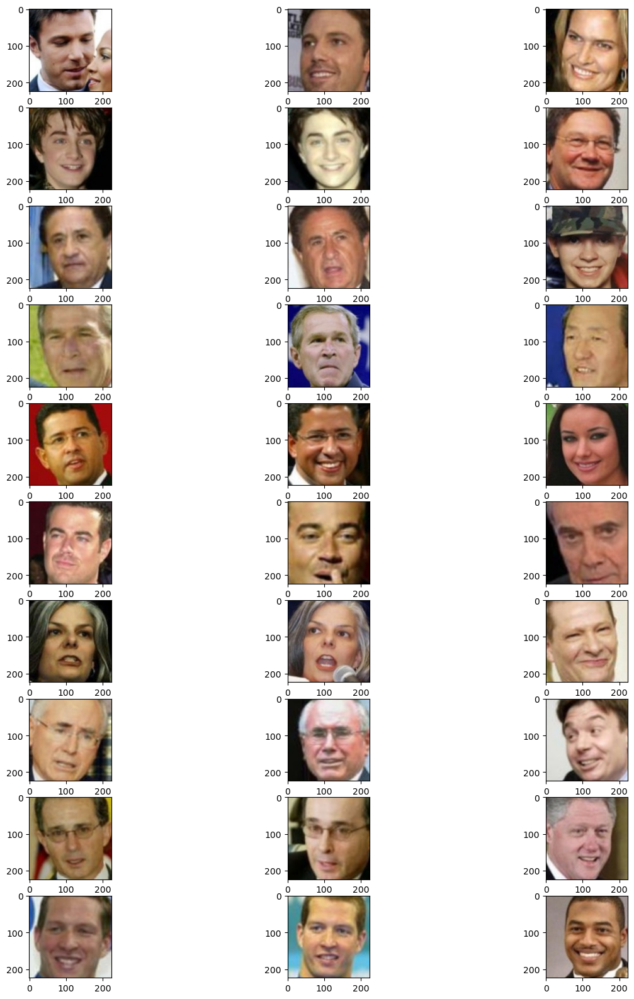

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
Epoch 1/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - loss: 0.9301Accuracy on test = 0.76053
Epoch 1: Accuracy on test = 0.76053, Loss = 0.87347, Val Loss = 0.76161, AP Mean = 0.56610, AN Mean = 0.92644
64/64 ━━━━━━━━━━━━━━━━━━━━ 979s 15s/step - loss: 0.9292 - val_loss: 0.7616 - learning_rate: 1.0000e-04
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - loss: 0.7431Accuracy on test = 0.77717
Epoch 2: Accuracy on test = 0.77717, Loss = 0.71296, Val Loss = 0.69587, AP Mean = 0.54850, AN Mean = 1.00976
64/64 ━━━━━━━━━━━━━━━━━━━━ 957s 15s/step - loss: 0.7426 - val_loss: 0.6959 - learning_rate: 1.0000e-04
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - loss: 0.6690Accuracy on test = 0.78057
Epoch 3: Accuracy on test = 0.78057, Loss = 0.65510, Val Loss = 0.65158, AP Mean = 0.57688, AN Mean = 1.08124
64/64 ━━━━━━━━━━━━━━━━━━━━ 952s 15s/step - loss: 0.6688 - val_loss: 0.6516 - learning_rate: 1.0000e-04
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━

KeyboardInterrupt: 

In [ ]:
import os
import cv2
import random
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers, metrics, Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, LearningRateScheduler
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input as vgg_preprocess_input
import datetime

# Set random seeds for consistency
random.seed(5)
np.random.seed(5)
tf.random.set_seed(5)

# Directories
ROOT = "/Users/pavlovichv/Desktop/Extracted Faces/Extracted Faces"
TARGET_SHAPE = (224, 224)  # Target shape for VGGFace

def read_image(directory, folder, image_name):
    path = os.path.join(directory, folder, image_name)
    image = cv2.imread(path)
    if image is None:
        raise ValueError(f"Unable to read image at {path}")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, TARGET_SHAPE)
    return image

def split_dataset(directory, split=0.7):
    folders = [f for f in os.listdir(directory) if os.path.isdir(os.path.join(directory, f))]
    num_train = int(len(folders) * split)
  
    random.shuffle(folders)
  
    train_list = {folder: len(os.listdir(os.path.join(directory, folder))) for folder in folders[:num_train]}
    test_list = {folder: len(os.listdir(os.path.join(directory, folder))) for folder in folders[num_train:]}
  
    return train_list, test_list

def create_triplets(directory, folder_list, max_files=10):
    triplets = []
    folders = list(folder_list.keys())
  
    for folder in folders:
        path = os.path.join(directory, folder)
        files = [f for f in os.listdir(path) if os.path.isfile(os.path.join(path, f))][:max_files]
        num_files = len(files)
      
        for i in range(num_files - 1):
            for j in range(i + 1, num_files):
                anchor = (folder, files[i])
                positive = (folder, files[j])

                neg_folder = folder
                while neg_folder == folder:
                    neg_folder = random.choice(folders)
                neg_files = [f for f in os.listdir(os.path.join(directory, neg_folder)) if os.path.isfile(os.path.join(directory, neg_folder, f))]
                negative = (neg_folder, random.choice(neg_files))

                triplets.append((anchor, positive, negative))
  
    random.shuffle(triplets)
    return triplets

# Split the dataset
train_list, test_list = split_dataset(ROOT, split=0.7)

# Create triplets
train_triplet = create_triplets(ROOT, train_list)
test_triplet = create_triplets(ROOT, test_list)

print("Number of training triplets:", len(train_triplet))
print("Number of testing triplets:", len(test_triplet))
print("Total triplets:", len(train_triplet) + len(test_triplet))

print("\nExamples of triplets:")
for i in range(5):
    print(train_triplet[i])

def augment_image(image):
    datagen = ImageDataGenerator(
        rotation_range=30,
        width_shift_range=0.3,
        height_shift_range=0.3,
        shear_range=0.3,
        zoom_range=0.3,
        horizontal_flip=True,
        fill_mode='nearest'
    )
    image = image.reshape((1,) + image.shape)  # Reshape image to (1, height, width, channels)
    iterator = datagen.flow(image, batch_size=1)
    augmented_image = next(iterator)[0]  # Use next(iterator) to get the augmented image
    return augmented_image

def get_batch(triplet_list, batch_size=64, preprocess=True, augment=False):
    batch_steps = max(1, len(triplet_list) // batch_size)  # Ensure at least 1 step per epoch
  
    for i in range(batch_steps):
        anchor = []
        positive = []
        negative = []
      
        j = i * batch_size
        while j < (i + 1) * batch_size and j < len(triplet_list):
            a, p, n = triplet_list[j]
            a_img = read_image(ROOT, a[0], a[1])
            p_img = read_image(ROOT, p[0], p[1])
            n_img = read_image(ROOT, n[0], n[1])
          
            if augment:
                a_img = augment_image(a_img)
                p_img = augment_image(p_img)
                n_img = augment_image(n_img)
              
            if a_img is not None and p_img is not None and n_img is not None:
                anchor.append(a_img)
                positive.append(p_img)
                negative.append(n_img)
            j += 1
      
        anchor = np.array(anchor)
        positive = np.array(positive)
        negative = np.array(negative)
      
        if preprocess:
            anchor = vgg_preprocess_input(anchor)
            positive = vgg_preprocess_input(positive)
            negative = vgg_preprocess_input(negative)
      
        yield (anchor, positive, negative)

# Visualization
num_plots = 10
f, axes = plt.subplots(num_plots, 3, figsize=(15, 20))

for x in get_batch(train_triplet, batch_size=num_plots, preprocess=False):
    a, p, n = x
    for i in range(num_plots):
        axes[i, 0].imshow(a[i])
        axes[i, 1].imshow(p[i])
        axes[i, 2].imshow(n[i])
    break

plt.show()

# Define the Encoder
def get_vggface_encoder(input_shape):
    vggface_model = VGG16(input_shape=input_shape, weights='imagenet', include_top=False, pooling='avg')
    vggface_model.trainable = False  # Freeze the VGGFace layers

    inputs = layers.Input(shape=input_shape)
    x = vggface_model(inputs)
    x = layers.Flatten()(x)
    x = layers.Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.Lambda(lambda x: tf.math.l2_normalize(x, axis=1))(x)
    return Model(inputs, x, name="Encode_Model")

# Define the Distance Layer
class DistanceLayer(layers.Layer):
    # A layer to compute ‖f(A) - f(P)‖² and ‖f(A) - f(N)‖²
    def __init__(self, **kwargs):
        super().__init__(**kwargs)

    def call(self, anchor, positive, negative):
        ap_distance = tf.reduce_sum(tf.square(anchor - positive), -1)
        an_distance = tf.reduce_sum(tf.square(anchor - negative), -1)
        return (ap_distance, an_distance)

# Define the Siamese Network
def get_siamese_network(input_shape=(224, 224, 3)):
    encoder = get_vggface_encoder(input_shape)
  
    # Input Layers for the images
    anchor_input   = layers.Input(input_shape, name="Anchor_Input")
    positive_input = layers.Input(input_shape, name="Positive_Input")
    negative_input = layers.Input(input_shape, name="Negative_Input")
  
    # Generate the encodings (feature vectors) for the images
    encoded_a = encoder(anchor_input)
    encoded_p = encoder(positive_input)
    encoded_n = encoder(negative_input)
  
    # A layer to compute ‖f(A) - f(P)‖² and ‖f(A) - f(N)‖²
    distances = DistanceLayer()(
        encoded_a,
        encoded_p,
        encoded_n
    )
  
    # Creating the Model
    siamese_network = Model(
        inputs  = [anchor_input, positive_input, negative_input],
        outputs = distances,
        name = "Siamese_Network"
    )
    return siamese_network

# Define Custom Triplet Loss
class TripletLoss(tf.keras.losses.Loss):
    def __init__(self, margin=1.0, name='triplet_loss'):
        super().__init__(name=name)
        self.margin = margin

    def call(self, y_true, y_pred):
        ap_distance, an_distance = y_pred
        loss = tf.maximum(ap_distance - an_distance + self.margin, 0.0)
        return tf.reduce_mean(loss)

# Define the SiameseModel with custom training and testing steps
class SiameseModel(Model):
    def __init__(self, siamese_network, margin=1.0):
        super(SiameseModel, self).__init__()
        self.margin = margin
        self.siamese_network = siamese_network
        self.loss_tracker = metrics.Mean(name="loss")
        self.triplet_loss = TripletLoss(margin=margin)

    def call(self, inputs):
        return self.siamese_network(inputs)

    def train_step(self, data):
        anchor, positive, negative = data
        dummy_y_true = tf.ones((tf.shape(anchor)[0], 1))  # Create a dummy tensor for y_true
        with tf.GradientTape() as tape:
            ap_distance, an_distance = self.siamese_network([anchor, positive, negative])
            loss = self.triplet_loss(dummy_y_true, (ap_distance, an_distance))
        
        gradients = tape.gradient(loss, self.siamese_network.trainable_weights)
        self.optimizer.apply_gradients(zip(gradients, self.siamese_network.trainable_weights))
        
        self.loss_tracker.update_state(loss)
        return {"loss": self.loss_tracker.result()}

    def test_step(self, data):
        anchor, positive, negative = data
        dummy_y_true = tf.ones((tf.shape(anchor)[0], 1))  # Create a dummy tensor for y_true
        ap_distance, an_distance = self.siamese_network([anchor, positive, negative])
        loss = self.triplet_loss(dummy_y_true, (ap_distance, an_distance))
        
        self.loss_tracker.update_state(loss)
        return {"loss": self.loss_tracker.result()}

    @property
    def metrics(self):
        return [self.loss_tracker]

# Compile the model
input_shape = (224, 224, 3)
siamese_network = get_siamese_network(input_shape)
siamese_model = SiameseModel(siamese_network, margin=1.0)

# Replace optimizer with the standard Adam optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)  # Adjusted learning rate
siamese_model.compile(optimizer=optimizer)

# Add callbacks
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=5,
    min_lr=1e-7,
    verbose=1
)

early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True,
    verbose=1
)

def scheduler(epoch, lr):
    if epoch < 10:
        return float(lr)
    else:
        return float(lr * tf.math.exp(-0.1))

lr_scheduler = LearningRateScheduler(scheduler)

# TensorBoard for better visualization
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

# Convert batches to dataset
def batch_to_dataset(triplets, batch_size):
    def generator():
        for batch in get_batch(triplets, batch_size=batch_size, preprocess=True, augment=True):  # Enable augmentation
            yield batch
  
    return tf.data.Dataset.from_generator(generator, output_signature=(
        (tf.TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32),
         tf.TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32),
         tf.TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32))
    )).repeat()  # Ensure the dataset repeats

# Convert training and testing triplets to datasets
batch_size = 128  # Increase the batch size
train_dataset = batch_to_dataset(train_triplet, batch_size=batch_size)
test_dataset = batch_to_dataset(test_triplet, batch_size=batch_size)

# Calculate steps per epoch
steps_per_epoch = max(1, len(train_triplet) // batch_size)
validation_steps = max(1, len(test_triplet) // batch_size)

# Testing the model
def test_on_triplets(batch_size=128):
    pos_scores = []
    neg_scores = []

    for data in get_batch(test_triplet, batch_size=batch_size):
        anchor, positive, negative = data
        prediction = siamese_model([anchor, positive, negative])
        pos_scores += list(prediction[0].numpy())  # Convert tensor to numpy
        neg_scores += list(prediction[1].numpy())  # Convert tensor to numpy
  
    accuracy = np.sum(np.array(pos_scores) < np.array(neg_scores)) / len(pos_scores)
    ap_mean = np.mean(pos_scores)
    an_mean = np.mean(neg_scores)
    ap_stds = np.std(pos_scores)
    an_stds = np.std(neg_scores)
  
    print(f"Accuracy on test = {accuracy:.5f}")
    return (accuracy, ap_mean, an_mean, ap_stds, an_stds)

# Custom callback for accuracy calculation
class AccuracyCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        test_results = test_on_triplets(batch_size=128)
        print(f"Epoch {epoch + 1}: Accuracy on test = {test_results[0]:.5f}, "
              f"Loss = {logs['loss']:.5f}, Val Loss = {logs['val_loss']:.5f}, "
              f"AP Mean = {test_results[1]:.5f}, AN Mean = {test_results[2]:.5f}")

accuracy_callback = AccuracyCallback()

# Training the Model using fit
history = siamese_model.fit(
    train_dataset,
    epochs=100,
    validation_data=test_dataset,
    callbacks=[reduce_lr, early_stopping, accuracy_callback, tensorboard_callback, lr_scheduler],
    steps_per_epoch=steps_per_epoch,
    validation_steps=validation_steps
)

# Saving the model after all epochs run
siamese_model.save_weights("vggface_siamese_model.weights.h5")

# Final test results
test_results = test_on_triplets(batch_size=128)
print(f"Test results: {test_results}")


PubFig DataSet

Number of training triplets: 4701
Number of testing triplets: 2025
Total triplets: 6726

Examples of triplets:
(('Lindsay Lohan', '0.jpg'), ('Lindsay Lohan', '105.jpg'), ('Mark Ruffalo', '4.jpg'))
(('David Duchovny', '106.jpg'), ('David Duchovny', '113.jpg'), ('Jennifer Aniston', '114.jpg'))
(('Shinzo Abe', '11.jpg'), ('Shinzo Abe', '13.jpg'), ('Lindsay Lohan', '525.jpg'))
(('David Duchovny', '1.jpg'), ('David Duchovny', '106.jpg'), ('Gordon Brown', '16.jpg'))
(('Russell Crowe', '0.jpg'), ('Russell Crowe', '1.jpg'), ('Mariah Carey', '22.jpg'))


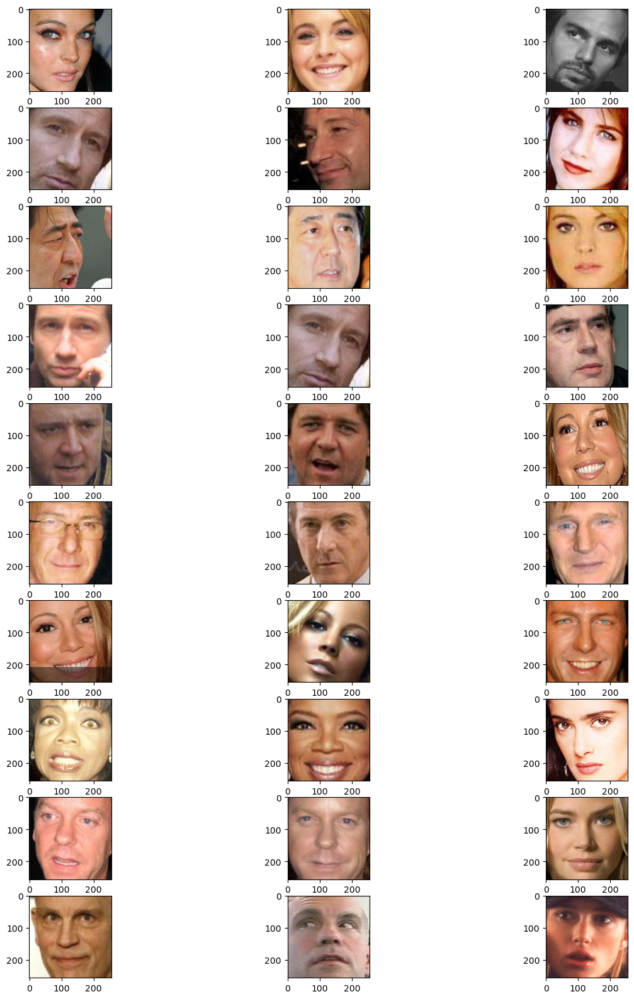

Epoch 1/100
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 0.8332Accuracy on test = 0.83594
Epoch 1: Accuracy on test = 0.83594, Loss = 0.77437, Val Loss = 0.69136, AP Mean = 0.63149, AN Mean = 1.19542
36/36 ━━━━━━━━━━━━━━━━━━━━ 429s 12s/step - loss: 0.8316 - val_loss: 0.6914 - learning_rate: 1.0000e-04
Epoch 2/100
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - loss: 0.6505Accuracy on test = 0.84427
Epoch 2: Accuracy on test = 0.84427, Loss = 0.64966, Val Loss = 0.67510, AP Mean = 0.61794, AN Mean = 1.27752
36/36 ━━━━━━━━━━━━━━━━━━━━ 366s 10s/step - loss: 0.6504 - val_loss: 0.6751 - learning_rate: 1.0000e-04
Epoch 3/100
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - loss: 0.6300Accuracy on test = 0.85781
Epoch 3: Accuracy on test = 0.85781, Loss = 0.61749, Val Loss = 0.62404, AP Mean = 0.59951, AN Mean = 1.32048
36/36 ━━━━━━━━━━━━━━━━━━━━ 363s 10s/step - loss: 0.6296 - val_loss: 0.6240 - learning_rate: 1.0000e-04
Epoch 4/100
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - loss: 0.5800Accuracy on test = 0.864

In [ ]:
import os
import cv2
import random
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers, metrics, Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, LearningRateScheduler
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import datetime
from keras_facenet import FaceNet

# Set random seeds for consistency
random.seed(5)
np.random.seed(5)
tf.random.set_seed(5)

# Directories
ROOT = "/Users/pavlovichv/Desktop/CelebDataProcessed"
TARGET_SHAPE = (256, 256)  # Target shape for resizing images

def read_image(directory, folder, image_name):
    path = os.path.join(directory, folder, image_name)
    image = cv2.imread(path)
    if image is None:
        raise ValueError(f"Unable to read image at {path}")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, TARGET_SHAPE)
    return image

def split_dataset(directory, split=0.7):
    folders = [f for f in os.listdir(directory) if os.path.isdir(os.path.join(directory, f))]
    num_train = int(len(folders) * split)
  
    random.shuffle(folders)
  
    train_list = {folder: len(os.listdir(os.path.join(directory, folder))) for folder in folders[:num_train]}
    test_list = {folder: len(os.listdir(os.path.join(directory, folder))) for folder in folders[num_train:]}
  
    return train_list, test_list

def create_triplets(directory, folder_list, max_files=10):
    triplets = []
    folders = list(folder_list.keys())
  
    for folder in folders:
        path = os.path.join(directory, folder)
        files = [f for f in os.listdir(path) if os.path.isfile(os.path.join(path, f))][:max_files]
        num_files = len(files)
      
        for i in range(num_files - 1):
            for j in range(i + 1, num_files):
                anchor = (folder, files[i])
                positive = (folder, files[j])

                neg_folder = folder
                while neg_folder == folder:
                    neg_folder = random.choice(folders)
                neg_files = [f for f in os.listdir(os.path.join(directory, neg_folder)) if os.path.isfile(os.path.join(directory, neg_folder, f))]
                negative = (neg_folder, random.choice(neg_files))

                triplets.append((anchor, positive, negative))
  
    random.shuffle(triplets)
    return triplets

# Split the dataset
train_list, test_list = split_dataset(ROOT, split=0.7)

# Create triplets
train_triplet = create_triplets(ROOT, train_list)
test_triplet = create_triplets(ROOT, test_list)

print("Number of training triplets:", len(train_triplet))
print("Number of testing triplets:", len(test_triplet))
print("Total triplets:", len(train_triplet) + len(test_triplet))

print("\nExamples of triplets:")
for i in range(5):
    print(train_triplet[i])

def augment_image(image):
    datagen = ImageDataGenerator(
        rotation_range=30,
        width_shift_range=0.3,
        height_shift_range=0.3,
        shear_range=0.3,
        zoom_range=0.3,
        horizontal_flip=True,
        fill_mode='nearest'
    )
    image = image.reshape((1,) + image.shape)  # Reshape image to (1, height, width, channels)
    iterator = datagen.flow(image, batch_size=1)
    augmented_image = next(iterator)[0]  # Use next(iterator) to get the augmented image
    return augmented_image

def get_batch(triplet_list, batch_size=64, preprocess=True, augment=False):
    batch_steps = max(1, len(triplet_list) // batch_size)  # Ensure at least 1 step per epoch
  
    for i in range(batch_steps):
        anchor = []
        positive = []
        negative = []
      
        j = i * batch_size
        while j < (i + 1) * batch_size and j < len(triplet_list):
            a, p, n = triplet_list[j]
            a_img = read_image(ROOT, a[0], a[1])
            p_img = read_image(ROOT, p[0], p[1])
            n_img = read_image(ROOT, n[0], n[1])
          
            if augment:
                a_img = augment_image(a_img)
                p_img = augment_image(p_img)
                n_img = augment_image(n_img)
              
            if a_img is not None and p_img is not None and n_img is not None:
                anchor.append(a_img)
                positive.append(p_img)
                negative.append(n_img)
            j += 1
      
        anchor = np.array(anchor)
        positive = np.array(positive)
        negative = np.array(negative)
      
        if preprocess:
            anchor = preprocess_input(anchor)
            positive = preprocess_input(positive)
            negative = preprocess_input(negative)
      
        yield (anchor, positive, negative)

# Visualization
num_plots = 10
f, axes = plt.subplots(num_plots, 3, figsize=(15, 20))

for x in get_batch(train_triplet, batch_size=num_plots, preprocess=False):
    a, p, n = x
    for i in range(num_plots):
        axes[i, 0].imshow(a[i])
        axes[i, 1].imshow(p[i])
        axes[i, 2].imshow(n[i])
    break

plt.show()

# Define the Encoder
def get_facenet_encoder(input_shape):
    facenet_model = FaceNet()
    facenet_model.model.trainable = False  # Freeze the FaceNet layers

    inputs = layers.Input(shape=input_shape)
    x = facenet_model.model(inputs)
    x = layers.Flatten()(x)
    x = layers.Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.Lambda(lambda x: tf.math.l2_normalize(x, axis=1))(x)
    return Model(inputs, x, name="Encode_Model")

# Define the Distance Layer
class DistanceLayer(layers.Layer):
    # A layer to compute ‖f(A) - f(P)‖² and ‖f(A) - f(N)‖²
    def __init__(self, **kwargs):
        super().__init__(**kwargs)

    def call(self, anchor, positive, negative):
        ap_distance = tf.reduce_sum(tf.square(anchor - positive), -1)
        an_distance = tf.reduce_sum(tf.square(anchor - negative), -1)
        return (ap_distance, an_distance)

# Define the Siamese Network
def get_siamese_network(input_shape=(256, 256, 3)):  # Update input shape
    encoder = get_facenet_encoder(input_shape)
  
    # Input Layers for the images
    anchor_input   = layers.Input(input_shape, name="Anchor_Input")
    positive_input = layers.Input(input_shape, name="Positive_Input")
    negative_input = layers.Input(input_shape, name="Negative_Input")
  
    # Generate the encodings (feature vectors) for the images
    encoded_a = encoder(anchor_input)
    encoded_p = encoder(positive_input)
    encoded_n = encoder(negative_input)
  
    # A layer to compute ‖f(A) - f(P)‖² and ‖f(A) - f(N)‖²
    distances = DistanceLayer()(
        encoded_a,
        encoded_p,
        encoded_n
    )
  
    # Creating the Model
    siamese_network = Model(
        inputs  = [anchor_input, positive_input, negative_input],
        outputs = distances,
        name = "Siamese_Network"
    )
    return siamese_network

# Define Custom Triplet Loss
class TripletLoss(tf.keras.losses.Loss):
    def __init__(self, margin=1.0, name='triplet_loss'):
        super().__init__(name=name)
        self.margin = margin

    def call(self, y_true, y_pred):
        ap_distance, an_distance = y_pred
        loss = tf.maximum(ap_distance - an_distance + self.margin, 0.0)
        return tf.reduce_mean(loss)

# Define the SiameseModel with custom training and testing steps
class SiameseModel(Model):
    def __init__(self, siamese_network, margin=1.0):
        super(SiameseModel, self).__init__()
        self.margin = margin
        self.siamese_network = siamese_network
        self.loss_tracker = metrics.Mean(name="loss")
        self.triplet_loss = TripletLoss(margin=margin)

    def call(self, inputs):
        return self.siamese_network(inputs)

    def train_step(self, data):
        anchor, positive, negative = data
        dummy_y_true = tf.ones((tf.shape(anchor)[0], 1))  # Create a dummy tensor for y_true
        with tf.GradientTape() as tape:
            ap_distance, an_distance = self.siamese_network([anchor, positive, negative])
            loss = self.triplet_loss(dummy_y_true, (ap_distance, an_distance))
        
        gradients = tape.gradient(loss, self.siamese_network.trainable_weights)
        self.optimizer.apply_gradients(zip(gradients, self.siamese_network.trainable_weights))
        
        self.loss_tracker.update_state(loss)
        return {"loss": self.loss_tracker.result()}

    def test_step(self, data):
        anchor, positive, negative = data
        dummy_y_true = tf.ones((tf.shape(anchor)[0], 1))  # Create a dummy tensor for y_true
        ap_distance, an_distance = self.siamese_network([anchor, positive, negative])
        loss = self.triplet_loss(dummy_y_true, (ap_distance, an_distance))
        
        self.loss_tracker.update_state(loss)
        return {"loss": self.loss_tracker.result()}

    @property
    def metrics(self):
        return [self.loss_tracker]

# Compile the model
input_shape = (256, 256, 3)  # Update input shape
siamese_network = get_siamese_network(input_shape)
siamese_model = SiameseModel(siamese_network, margin=1.0)

# Replace optimizer with the standard Adam optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)  # Adjusted learning rate
siamese_model.compile(optimizer=optimizer)

# Add callbacks
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=5,
    min_lr=1e-7,
    verbose=1
)

early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True,
    verbose=1
)

def scheduler(epoch, lr):
    if epoch < 10:
        return float(lr)
    else:
        return float(lr * tf.math.exp(-0.1))

lr_scheduler = LearningRateScheduler(scheduler)

# TensorBoard for better visualization
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

# Convert batches to dataset
def batch_to_dataset(triplets, batch_size):
    def generator():
        for batch in get_batch(triplets, batch_size=batch_size, preprocess=True, augment=True):  # Enable augmentation
            yield batch
  
    return tf.data.Dataset.from_generator(generator, output_signature=(
        (tf.TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32),  # Update input shape
         tf.TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32),  # Update input shape
         tf.TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32))  # Update input shape
    )).repeat()  # Ensure the dataset repeats

# Convert training and testing triplets to datasets
batch_size = 128  # Increase the batch size
train_dataset = batch_to_dataset(train_triplet, batch_size=batch_size)
test_dataset = batch_to_dataset(test_triplet, batch_size=batch_size)

# Calculate steps per epoch
steps_per_epoch = max(1, len(train_triplet) // batch_size)
validation_steps = max(1, len(test_triplet) // batch_size)

# Testing the model
def test_on_triplets(batch_size=128):
    pos_scores = []
    neg_scores = []

    for data in get_batch(test_triplet, batch_size=batch_size):
        anchor, positive, negative = data
        prediction = siamese_model([anchor, positive, negative])
        pos_scores += list(prediction[0].numpy())  # Convert tensor to numpy
        neg_scores += list(prediction[1].numpy())  # Convert tensor to numpy
  
    accuracy = np.sum(np.array(pos_scores) < np.array(neg_scores)) / len(pos_scores)
    ap_mean = np.mean(pos_scores)
    an_mean = np.mean(neg_scores)
    ap_stds = np.std(pos_scores)
    an_stds = np.std(neg_scores)
  
    print(f"Accuracy on test = {accuracy:.5f}")
    return (accuracy, ap_mean, an_mean, ap_stds, an_stds)

# Custom callback for accuracy calculation
class AccuracyCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        test_results = test_on_triplets(batch_size=128)
        print(f"Epoch {epoch + 1}: Accuracy on test = {test_results[0]:.5f}, "
              f"Loss = {logs['loss']:.5f}, Val Loss = {logs['val_loss']:.5f}, "
              f"AP Mean = {test_results[1]:.5f}, AN Mean = {test_results[2]:.5f}")

accuracy_callback = AccuracyCallback()

# Training the Model using fit
history = siamese_model.fit(
    train_dataset,
    epochs=100,
    validation_data=test_dataset,
    callbacks=[reduce_lr, early_stopping, accuracy_callback, tensorboard_callback, lr_scheduler],
    steps_per_epoch=steps_per_epoch,
    validation_steps=validation_steps
)

# Saving the model after all epochs run
siamese_model.save_weights("facenet_siamese_model_Celebs.weights.h5")

# Final test results
test_results = test_on_triplets(batch_size=128)
print(f"Test results: {test_results}")


In [ ]:
import os
import cv2
import numpy as np
import tensorflow as tf
import pickle
from keras_facenet import FaceNet
from tensorflow.keras.models import load_model

# Set random seeds for consistency
random.seed(5)
np.random.seed(5)
tf.random.set_seed(5)

# Directories
ROOT = "/Users/pavlovichv/Desktop/CelebDataProcessed"
TARGET_SHAPE = (256, 256)  # Target shape for resizing images
ENCODINGS_FILE = "celebs.pkl"
MODEL_WEIGHTS_PATH = "facenet_siamese_model_Celebs.weights.h5"

def read_image(image_path):
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError(f"Unable to read image at {image_path}")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, TARGET_SHAPE)
    return np.expand_dims(image, axis=0)

# Define the Encoder
def get_facenet_encoder(input_shape):
    facenet_model = FaceNet()
    facenet_model.model.trainable = False  # Freeze the FaceNet layers

    inputs = layers.Input(shape=input_shape)
    x = facenet_model.model(inputs)
    x = layers.Flatten()(x)
    x = layers.Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.Lambda(lambda x: tf.math.l2_normalize(x, axis=1))(x)
    return Model(inputs, x, name="Encode_Model")

def load_siamese_model(weights_path):
    input_shape = (256, 256, 3)
    encoder_model = get_facenet_encoder(input_shape)
    siamese_network = get_siamese_network(input_shape)
    siamese_model = SiameseModel(siamese_network, margin=1.0)
    siamese_model.load_weights(weights_path)
    return siamese_model

siamese_model = load_siamese_model(MODEL_WEIGHTS_PATH)
encoder_model = siamese_model.siamese_network.get_layer('Encode_Model')

# Function to generate and save encodings
def generate_and_save_encodings(directory, encoder_model, output_file):
    encodings = {}
    for root, _, files in os.walk(directory):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg')):
                image_path = os.path.join(root, file)
                image = read_image(image_path)
                encoding = encoder_model.predict(image).flatten()
                label = os.path.basename(root)
                encodings[image_path] = (encoding, label)
    
    with open(output_file, 'wb') as f:
        pickle.dump(encodings, f)
    print(f"Encodings saved to {output_file}")

# Generate and save encodings for all images in the dataset
generate_and_save_encodings(ROOT, encoder_model, ENCODINGS_FILE)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━

In [6]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, Model
from sklearn.metrics.pairwise import cosine_similarity
import pickle

# Set the path to the saved encodings file
ENCODINGS_FILE = "celebs.pkl"  # or "new_dataset_encodings.pkl" if you encoded a different dataset

# Function to read and preprocess image
def read_image(image_path, target_shape=(256, 256)):
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError(f"Unable to read image at {image_path}")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, target_shape)
    return np.expand_dims(image, axis=0)

# Function to load the saved encodings
def load_encodings(file_path):
    with open(file_path, 'rb') as f:
        encodings = pickle.load(f)
    return encodings

# Function to get the encoding of a single image
def get_image_encoding(image_path, encoder_model):
    image = read_image(image_path)
    encoding = encoder_model.predict(image).flatten()
    return encoding

# Function to compute cosine similarity
def compute_cosine_similarity(encoding, known_encodings):
    similarities = {}
    for path, (known_encoding, label) in known_encodings.items():
        similarity = cosine_similarity([encoding], [known_encoding])[0][0]
        similarities[path] = (similarity, label)
    return similarities

# Load the trained Siamese model
weights_path = "facenet_siamese_model_Celebs.weights.h5"

# Define the Encoder
def get_facenet_encoder(input_shape):
    facenet_model = FaceNet()
    facenet_model.model.trainable = False  # Freeze the FaceNet layers

    inputs = layers.Input(shape=input_shape)
    x = facenet_model.model(inputs)
    x = layers.Flatten()(x)
    x = layers.Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.Lambda(lambda x: tf.math.l2_normalize(x, axis=1))(x)
    return Model(inputs, x, name="Encode_Model")

def load_siamese_model(weights_path):
    input_shape = (256, 256, 3)
    encoder_model = get_facenet_encoder(input_shape)
    siamese_network = get_siamese_network(input_shape)
    siamese_model = SiameseModel(siamese_network, margin=1.0)
    siamese_model.load_weights(weights_path)
    return siamese_model

siamese_model = load_siamese_model(weights_path)
encoder_model = siamese_model.siamese_network.get_layer('Encode_Model')

# Path to a single image for classification
single_image_path = "/Users/pavlovichv/Desktop/TestImages/Will-Smith-Celeb-Bio_face_1.jpg"

# Load the saved encodings
known_encodings = load_encodings(ENCODINGS_FILE)

# Get the encoding of the single image
single_image_encoding = get_image_encoding(single_image_path, encoder_model)

# Compute cosine similarities
similarities = compute_cosine_similarity(single_image_encoding, known_encodings)

# Sort the similarities
sorted_similarities = sorted(similarities.items(), key=lambda x: x[1][0], reverse=True)

# Print the top 20 most similar encodings
print("Top 20:")
for i, (path, (similarity, label)) in enumerate(sorted_similarities[:20]):
    print(f"Top {i + 1}:")
    print(f"  Similarity: {similarity}")
    print(f"  Label: {label}")
    print(f"  Path: {path}")

# Print the predicted label for the image
predicted_label = sorted_similarities[0][1][1]
print(f"\nPredicted label for the image is: {predicted_label}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Top 20:
Top 1:
  Similarity: 0.5719779133796692
  Label: Jared Leto
  Path: /Users/pavlovichv/Desktop/CelebDataProcessed\Jared Leto\55.jpg
Top 2:
  Similarity: 0.5687996745109558
  Label: George Clooney
  Path: /Users/pavlovichv/Desktop/CelebDataProcessed\George Clooney\68.jpg
Top 3:
  Similarity: 0.5681356191635132
  Label: Lindsay Lohan
  Path: /Users/pavlovichv/Desktop/CelebDataProcessed\Lindsay Lohan\53.jpg
Top 4:
  Similarity: 0.5668989419937134
  Label: Quincy Jones
  Path: /Users/pavlovichv/Desktop/CelebDataProcessed\Quincy Jones\23.jpg
Top 5:
  Similarity: 0.5656074285507202
  Label: Lindsay Lohan
  Path: /Users/pavlovichv/Desktop/CelebDataProcessed\Lindsay Lohan\134.jpg
Top 6:
  Similarity: 0.5641194581985474
  Label: Miley Cyrus
  Path: /Users/pavlovichv/Desktop/CelebDataProcessed\Miley Cyrus\347.jpg
Top 7:
  Similarity: 0.5632168054580688
  Label: Salma Hayek
  Path: /Users/pavlovichv/Desktop/CelebDataProcessed\Salma Hayek\59.jpg
Top 8:
  

In [5]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, Model
from sklearn.metrics.pairwise import cosine_similarity
import pickle
from collections import Counter

# Set the path to the saved encodings file
ENCODINGS_FILE = "celebs.pkl"  # or "new_dataset_encodings.pkl" if you encoded a different dataset

# Function to read and preprocess image
def read_image(image_path, target_shape=(256, 256)):
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError(f"Unable to read image at {image_path}")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, target_shape)
    return np.expand_dims(image, axis=0)

# Function to load the saved encodings
def load_encodings(file_path):
    with open(file_path, 'rb') as f:
        encodings = pickle.load(f)
    return encodings

# Function to get the encoding of a single image
def get_image_encoding(image_path, encoder_model):
    image = read_image(image_path)
    encoding = encoder_model.predict(image).flatten()
    return encoding

# Function to compute cosine similarity
def compute_cosine_similarity(encoding, known_encodings):
    similarities = {}
    for path, (known_encoding, label) in known_encodings.items():
        similarity = cosine_similarity([encoding], [known_encoding])[0][0]
        similarities[path] = (similarity, label)
    return similarities

# Load the trained Siamese model
weights_path = "facenet_siamese_model_Celebs.weights.h5"

# Define the Encoder
def get_facenet_encoder(input_shape):
    facenet_model = FaceNet()
    facenet_model.model.trainable = False  # Freeze the FaceNet layers

    inputs = layers.Input(shape=input_shape)
    x = facenet_model.model(inputs)
    x = layers.Flatten()(x)
    x = layers.Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.Lambda(lambda x: tf.math.l2_normalize(x, axis=1))(x)
    return Model(inputs, x, name="Encode_Model")

def load_siamese_model(weights_path):
    input_shape = (256, 256, 3)
    encoder_model = get_facenet_encoder(input_shape)
    siamese_network = get_siamese_network(input_shape)
    siamese_model = SiameseModel(siamese_network, margin=1.0)
    siamese_model.load_weights(weights_path)
    return siamese_model

siamese_model = load_siamese_model(weights_path)
encoder_model = siamese_model.siamese_network.get_layer('Encode_Model')

# Path to a single image for classification
single_image_path = "/Users/pavlovichv/Desktop/TestImages/Will-Smith-Celeb-Bio_face_1.jpg"

# Load the saved encodings
known_encodings = load_encodings(ENCODINGS_FILE)

# Get the encoding of the single image
single_image_encoding = get_image_encoding(single_image_path, encoder_model)

# Compute cosine similarities
similarities = compute_cosine_similarity(single_image_encoding, known_encodings)

# Sort the similarities
sorted_similarities = sorted(similarities.items(), key=lambda x: x[1][0], reverse=True)

# Filter for similarities above 0.90
filtered_similarities = [(path, (similarity, label)) for path, (similarity, label) in sorted_similarities if similarity >= 0.90]

# Print the top 20 most similar encodings above 0.90
print("Top 20 with similarity >= 0.90:")
top_N = 20
for i, (path, (similarity, label)) in enumerate(filtered_similarities[:top_N]):
    print(f"Top {i + 1}:")
    print(f"  Similarity: {similarity}")
    print(f"  Label: {label}")
    print(f"  Path: {path}")

# Determine the most frequent label among the top N with similarity >= 0.90
if filtered_similarities:
    top_labels = [label for path, (similarity, label) in filtered_similarities[:top_N]]
    most_common_label = Counter(top_labels).most_common(1)[0][0]
    print(f"\nPredicted label for the image is: {most_common_label}")
else:
    print("No similarities above 0.90")


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Top 20 with similarity >= 0.90:
No similarities above 0.90


In [58]:
import cv2
import os

# Path to the folder containing images
input_folder = '/Users/pavlovichv/Desktop/TestImages'
output_folder = '/Users/pavlovichv/Desktop/TestImages'

# Create the output folder if it doesn't exist
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# Load the pre-trained Haar Cascade classifier for face detection
haar_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Function to detect and save faces from an image
def detect_and_save_faces(image_path, output_folder, file_name):
    # Read the image
    img = cv2.imread(image_path)
    if img is None:
        print(f"Cannot read image: {image_path}")
        return

    # Convert the image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Detect faces
    faces = haar_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))

    # Iterate over detected faces and save them
    for i, (x, y, w, h) in enumerate(faces):
        face = img[y:y+h, x:x+w]
        face_file_name = os.path.join(output_folder, f"{os.path.splitext(file_name)[0]}_face_{i+1}.jpg")
        cv2.imwrite(face_file_name, face)
        print(f"Face saved: {face_file_name}")

# Iterate through all images in the input folder
for file_name in os.listdir(input_folder):
    image_path = os.path.join(input_folder, file_name)
    detect_and_save_faces(image_path, output_folder, file_name)


Face saved: /Users/pavlovichv/Desktop/TestImages\075a3e67c1e6415ca47d6cd6fe25b566_face_1.jpg
Face saved: /Users/pavlovichv/Desktop/TestImages\AaronPerisol_face_1_face_1.jpg
Face saved: /Users/pavlovichv/Desktop/TestImages\AaronPerisol_face_1_face_1_face_1.jpg
Face saved: /Users/pavlovichv/Desktop/TestImages\gettyimages-1064769920_1-82442a6de028400ea4f8d0d7148f0b6e_face_1.jpg
Face saved: /Users/pavlovichv/Desktop/TestImages\gettyimages-1064769920_1-82442a6de028400ea4f8d0d7148f0b6e_face_1_face_1.jpg
Face saved: /Users/pavlovichv/Desktop/TestImages\ig-obama-portrait-800x480_face_1.jpg
Face saved: /Users/pavlovichv/Desktop/TestImages\ig-obama-portrait-800x480_face_1_face_1.jpg
Face saved: /Users/pavlovichv/Desktop/TestImages\images_face_1.jpg
Face saved: /Users/pavlovichv/Desktop/TestImages\images_face_2.jpg
Face saved: /Users/pavlovichv/Desktop/TestImages\images_face_2_face_1.jpg
Face saved: /Users/pavlovichv/Desktop/TestImages\stephen-curry-mvp-season-1jpg_face_1.jpg
Face saved: /Users/p

KNN
/Users/pavlovichv/Desktop/TestImages/Will-Smith-Celeb-Bio_face_1.jpg

In [64]:
import pickle
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV
from sklearn.metrics import accuracy_score
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier

# Load the saved encodings
with open(ENCODINGS_FILE, 'rb') as f:
    encodings = pickle.load(f)

# Prepare data for KNN
X = []
y = []
for encoding, label in encodings.values():
    X.append(encoding)
    y.append(label)

X = np.array(X)
y = np.array(y)

# Encode the labels as integers
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Normalize the embeddings
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Reduce dimensionality
pca = PCA(n_components=0.95)  # Keep 95% of the variance
X = pca.fit_transform(X)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.3, random_state=42, stratify=y_encoded)

# Perform hyperparameter tuning using stratified k-fold cross-validation
param_grid_knn = {
    'n_neighbors': [3, 5, 7, 9, 11, 13, 15],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan', 'minkowski']
}

param_grid_svm = {
    'C': [0.1, 1, 10, 100],
    'gamma': ['scale', 'auto'],
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid']
}

param_grid_rf = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10]
}

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Train KNN
knn = KNeighborsClassifier()
grid_search_knn = GridSearchCV(knn, param_grid_knn, cv=cv, scoring='accuracy')
grid_search_knn.fit(X_train, y_train)

# Best parameters from GridSearch for KNN
print(f"KNN Best parameters: {grid_search_knn.best_params_}")
knn_best = grid_search_knn.best_estimator_
knn_best.fit(X_train, y_train)

# Train SVM
svm = SVC(probability=True)
grid_search_svm = GridSearchCV(svm, param_grid_svm, cv=cv, scoring='accuracy')
grid_search_svm.fit(X_train, y_train)

# Best parameters from GridSearch for SVM
print(f"SVM Best parameters: {grid_search_svm.best_params_}")
svm_best = grid_search_svm.best_estimator_
svm_best.fit(X_train, y_train)

# Train RandomForest
rf = RandomForestClassifier()
grid_search_rf = GridSearchCV(rf, param_grid_rf, cv=cv, scoring='accuracy')
grid_search_rf.fit(X_train, y_train)

# Best parameters from GridSearch for RandomForest
print(f"RF Best parameters: {grid_search_rf.best_params_}")
rf_best = grid_search_rf.best_estimator_
rf_best.fit(X_train, y_train)

# Evaluate the models
models = {'KNN': knn_best, 'SVM': svm_best, 'RF': rf_best}
for name, model in models.items():
    y_pred = model.predict(X_test)
    y_pred_labels = label_encoder.inverse_transform(y_pred)
    accuracy = accuracy_score(label_encoder.inverse_transform(y_test), y_pred_labels)
    print(f"{name} model accuracy: {accuracy:.4f}")

# Function to predict the label of a single image
def predict_image(image_path, model, encoder_model, scaler, pca, label_encoder):
    image = read_image(image_path)
    encoding = encoder_model.predict(image).flatten()
    encoding = scaler.transform([encoding])
    encoding = pca.transform(encoding)
    label_encoded = model.predict(encoding)
    label = label_encoder.inverse_transform(label_encoded)
    return label[0]

# Example usage
image_path = "/Users/pavlovichv/Desktop/TestImages/Will-Smith-Celeb-Bio_face_1.jpg"
predicted_label_knn = predict_image(image_path, knn_best, encoder_model, scaler, pca, label_encoder)
predicted_label_svm = predict_image(image_path, svm_best, encoder_model, scaler, pca, label_encoder)
predicted_label_rf = predict_image(image_path, rf_best, encoder_model, scaler, pca, label_encoder)

print(f"Predicted label for the image with KNN: {predicted_label_knn}")
print(f"Predicted label for the image with SVM: {predicted_label_svm}")
print(f"Predicted label for the image with RF: {predicted_label_rf}")


KNN Best parameters: {'metric': 'euclidean', 'n_neighbors': 13, 'weights': 'distance'}


FaceNet Adjusted More Layers

Number of training triplets: 4701
Number of testing triplets: 2025
Total triplets: 6726

Examples of triplets:
(('Lindsay Lohan', '0.jpg'), ('Lindsay Lohan', '105.jpg'), ('Mark Ruffalo', '4.jpg'))
(('David Duchovny', '106.jpg'), ('David Duchovny', '113.jpg'), ('Jennifer Aniston', '114.jpg'))
(('Shinzo Abe', '11.jpg'), ('Shinzo Abe', '13.jpg'), ('Lindsay Lohan', '525.jpg'))
(('David Duchovny', '1.jpg'), ('David Duchovny', '106.jpg'), ('Gordon Brown', '16.jpg'))
(('Russell Crowe', '0.jpg'), ('Russell Crowe', '1.jpg'), ('Mariah Carey', '22.jpg'))


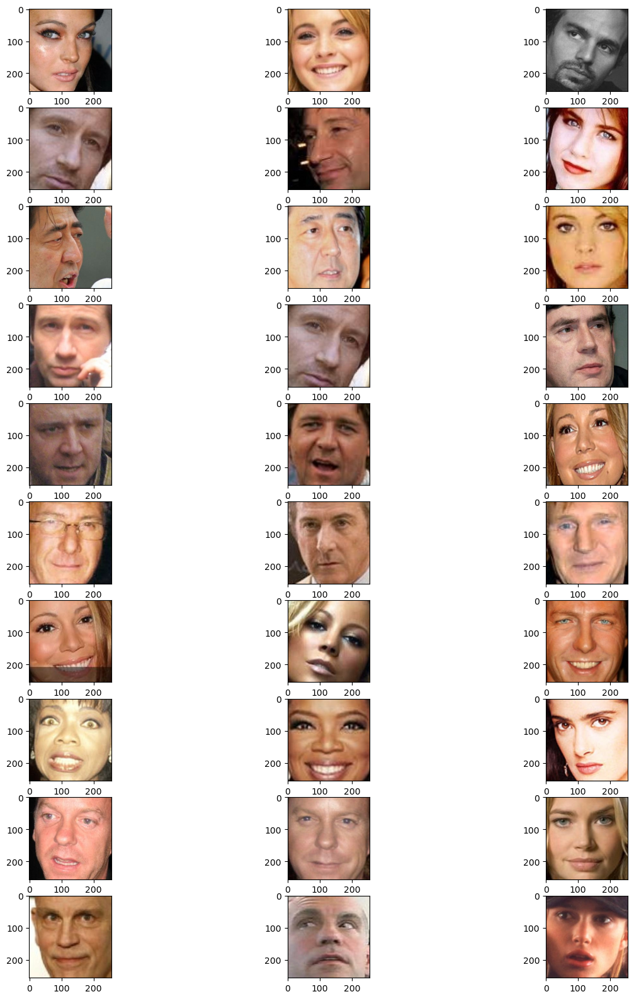

Epoch 1/100
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - loss: 0.9017Accuracy on test = 0.77135
Epoch 1: Accuracy on test = 0.77135, Loss = 0.85542, Val Loss = 0.78243, AP Mean = 0.58071, AN Mean = 1.08861
36/36 ━━━━━━━━━━━━━━━━━━━━ 381s 10s/step - loss: 0.9004 - val_loss: 0.7824 - learning_rate: 1.0000e-04
Epoch 2/100
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - loss: 0.7510Accuracy on test = 0.75833
Epoch 2: Accuracy on test = 0.75833, Loss = 0.74270, Val Loss = 0.76681, AP Mean = 0.54659, AN Mean = 1.09925
36/36 ━━━━━━━━━━━━━━━━━━━━ 346s 10s/step - loss: 0.7508 - val_loss: 0.7668 - learning_rate: 1.0000e-04
Epoch 3/100
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - loss: 0.7141Accuracy on test = 0.77812
Epoch 3: Accuracy on test = 0.77812, Loss = 0.70985, Val Loss = 0.75915, AP Mean = 0.51414, AN Mean = 1.15325
36/36 ━━━━━━━━━━━━━━━━━━━━ 344s 10s/step - loss: 0.7139 - val_loss: 0.7592 - learning_rate: 1.0000e-04
Epoch 4/100
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - loss: 0.6816Accuracy on test = 0.788

In [8]:
import os
import cv2
import random
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers, metrics, Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, LearningRateScheduler
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import datetime
from keras_facenet import FaceNet

# Set random seeds for consistency
random.seed(5)
np.random.seed(5)
tf.random.set_seed(5)

# Directories
ROOT = "/Users/pavlovichv/Desktop/CelebDataProcessed"
TARGET_SHAPE = (256, 256)  # Target shape for resizing images

def read_image(directory, folder, image_name):
    path = os.path.join(directory, folder, image_name)
    image = cv2.imread(path)
    if image is None:
        raise ValueError(f"Unable to read image at {path}")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, TARGET_SHAPE)
    image = image / 255.0  # Normalize image to range [0, 1]
    return image

def split_dataset(directory, split=0.7):
    folders = [f for f in os.listdir(directory) if os.path.isdir(os.path.join(directory, f))]
    num_train = int(len(folders) * split)
  
    random.shuffle(folders)
  
    train_list = {folder: len(os.listdir(os.path.join(directory, folder))) for folder in folders[:num_train]}
    test_list = {folder: len(os.listdir(os.path.join(directory, folder))) for folder in folders[num_train:]}
  
    return train_list, test_list

def create_triplets(directory, folder_list, max_files=10):
    triplets = []
    folders = list(folder_list.keys())
  
    for folder in folders:
        path = os.path.join(directory, folder)
        files = [f for f in os.listdir(path) if os.path.isfile(os.path.join(path, f))][:max_files]
        num_files = len(files)
      
        for i in range(num_files - 1):
            for j in range(i + 1, num_files):
                anchor = (folder, files[i])
                positive = (folder, files[j])

                neg_folder = folder
                while neg_folder == folder:
                    neg_folder = random.choice(folders)
                neg_files = [f for f in os.listdir(os.path.join(directory, neg_folder)) if os.path.isfile(os.path.join(directory, neg_folder, f))]
                negative = (neg_folder, random.choice(neg_files))

                triplets.append((anchor, positive, negative))
  
    random.shuffle(triplets)
    return triplets

# Split the dataset
train_list, test_list = split_dataset(ROOT, split=0.7)

# Create triplets
train_triplet = create_triplets(ROOT, train_list)
test_triplet = create_triplets(ROOT, test_list)

print("Number of training triplets:", len(train_triplet))
print("Number of testing triplets:", len(test_triplet))
print("Total triplets:", len(train_triplet) + len(test_triplet))

print("\nExamples of triplets:")
for i in range(5):
    print(train_triplet[i])

def augment_image(image):
    datagen = ImageDataGenerator(
        rotation_range=30,
        width_shift_range=0.3,
        height_shift_range=0.3,
        shear_range=0.3,
        zoom_range=0.3,
        horizontal_flip=True,
        fill_mode='nearest'
    )
    image = image.reshape((1,) + image.shape)  # Reshape image to (1, height, width, channels)
    iterator = datagen.flow(image, batch_size=1)
    augmented_image = next(iterator)[0]  # Use next(iterator) to get the augmented image
    return augmented_image

def get_batch(triplet_list, batch_size=64, augment=False):
    batch_steps = max(1, len(triplet_list) // batch_size)  # Ensure at least 1 step per epoch
  
    for i in range(batch_steps):
        anchor = []
        positive = []
        negative = []
      
        j = i * batch_size
        while j < (i + 1) * batch_size and j < len(triplet_list):
            a, p, n = triplet_list[j]
            a_img = read_image(ROOT, a[0], a[1])
            p_img = read_image(ROOT, p[0], p[1])
            n_img = read_image(ROOT, n[0], n[1])
          
            if augment:
                a_img = augment_image(a_img)
                p_img = augment_image(p_img)
                n_img = augment_image(n_img)
              
            if a_img is not None and p_img is not None and n_img is not None:
                anchor.append(a_img)
                positive.append(p_img)
                negative.append(n_img)
            j += 1
      
        yield (np.array(anchor), np.array(positive), np.array(negative))

# Visualization
num_plots = 10
f, axes = plt.subplots(num_plots, 3, figsize=(15, 20))

for x in get_batch(train_triplet, batch_size=num_plots, augment=False):
    a, p, n = x
    for i in range(num_plots):
        axes[i, 0].imshow(a[i])
        axes[i, 1].imshow(p[i])
        axes[i, 2].imshow(n[i])
    break

plt.show()

# Define the Encoder
def get_facenet_encoder(input_shape):
    facenet_model = FaceNet()
    facenet_model.model.trainable = False  # Freeze the FaceNet layers

    inputs = layers.Input(shape=input_shape)
    x = facenet_model.model(inputs)
    x = layers.Flatten()(x)
    x = layers.Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(64, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(32, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.Lambda(lambda x: tf.math.l2_normalize(x, axis=1))(x)
    return Model(inputs, x, name="Encode_Model")

# Define the Distance Layer
class DistanceLayer(layers.Layer):
    # A layer to compute ‖f(A) - f(P)‖² and ‖f(A) - f(N)‖²
    def __init__(self, **kwargs):
        super().__init__(**kwargs)

    def call(self, anchor, positive, negative):
        ap_distance = tf.reduce_sum(tf.square(anchor - positive), -1)
        an_distance = tf.reduce_sum(tf.square(anchor - negative), -1)
        return (ap_distance, an_distance)

# Define the Siamese Network
def get_siamese_network(input_shape=(256, 256, 3)):  # Update input shape
    encoder = get_facenet_encoder(input_shape)
  
    # Input Layers for the images
    anchor_input   = layers.Input(input_shape, name="Anchor_Input")
    positive_input = layers.Input(input_shape, name="Positive_Input")
    negative_input = layers.Input(input_shape, name="Negative_Input")
  
    # Generate the encodings (feature vectors) for the images
    encoded_a = encoder(anchor_input)
    encoded_p = encoder(positive_input)
    encoded_n = encoder(negative_input)
  
    # A layer to compute ‖f(A) - f(P)‖² and ‖f(A) - f(N)‖²
    distances = DistanceLayer()(
        encoded_a,
        encoded_p,
        encoded_n
    )
  
    # Creating the Model
    siamese_network = Model(
        inputs  = [anchor_input, positive_input, negative_input],
        outputs = distances,
        name = "Siamese_Network"
    )
    return siamese_network

# Define Custom Triplet Loss
class TripletLoss(tf.keras.losses.Loss):
    def __init__(self, margin=1.0, name='triplet_loss'):
        super().__init__(name=name)
        self.margin = margin

    def call(self, y_true, y_pred):
        ap_distance, an_distance = y_pred
        loss = tf.maximum(ap_distance - an_distance + self.margin, 0.0)
        return tf.reduce_mean(loss)

# Define the SiameseModel with custom training and testing steps
class SiameseModel(Model):
    def __init__(self, siamese_network, margin=1.0):
        super(SiameseModel, self).__init__()
        self.margin = margin
        self.siamese_network = siamese_network
        self.loss_tracker = metrics.Mean(name="loss")
        self.triplet_loss = TripletLoss(margin=margin)

    def call(self, inputs):
        return self.siamese_network(inputs)

    def train_step(self, data):
        anchor, positive, negative = data
        dummy_y_true = tf.ones((tf.shape(anchor)[0], 1))  # Create a dummy tensor for y_true
        with tf.GradientTape() as tape:
            ap_distance, an_distance = self.siamese_network([anchor, positive, negative])
            loss = self.triplet_loss(dummy_y_true, (ap_distance, an_distance))
        
        gradients = tape.gradient(loss, self.siamese_network.trainable_weights)
        self.optimizer.apply_gradients(zip(gradients, self.siamese_network.trainable_weights))
        
        self.loss_tracker.update_state(loss)
        return {"loss": self.loss_tracker.result()}

    def test_step(self, data):
        anchor, positive, negative = data
        dummy_y_true = tf.ones((tf.shape(anchor)[0], 1))  # Create a dummy tensor for y_true
        ap_distance, an_distance = self.siamese_network([anchor, positive, negative])
        loss = self.triplet_loss(dummy_y_true, (ap_distance, an_distance))
        
        self.loss_tracker.update_state(loss)
        return {"loss": self.loss_tracker.result()}

    @property
    def metrics(self):
        return [self.loss_tracker]

# Compile the model
input_shape = (256, 256, 3)  # Update input shape
siamese_network = get_siamese_network(input_shape)
siamese_model = SiameseModel(siamese_network, margin=1.0)

# Replace optimizer with the standard Adam optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)  # Adjusted learning rate
siamese_model.compile(optimizer=optimizer)

# Add callbacks
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=5,
    min_lr=1e-7,
    verbose=1
)

early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True,
    verbose=1
)

def scheduler(epoch, lr):
    if epoch < 10:
        return float(lr)
    else:
        return float(lr * tf.math.exp(-0.1))

lr_scheduler = LearningRateScheduler(scheduler)

# TensorBoard for better visualization
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

# Convert batches to dataset
def batch_to_dataset(triplets, batch_size):
    def generator():
        for batch in get_batch(triplets, batch_size=batch_size, augment=True):  # Enable augmentation
            yield batch
  
    return tf.data.Dataset.from_generator(generator, output_signature=(
        (tf.TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32),  # Update input shape
         tf.TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32),  # Update input shape
         tf.TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32))  # Update input shape
    )).repeat()  # Ensure the dataset repeats

# Convert training and testing triplets to datasets
batch_size = 128  # Increase the batch size
train_dataset = batch_to_dataset(train_triplet, batch_size=batch_size)
test_dataset = batch_to_dataset(test_triplet, batch_size=batch_size)

# Calculate steps per epoch
steps_per_epoch = max(1, len(train_triplet) // batch_size)
validation_steps = max(1, len(test_triplet) // batch_size)

# Testing the model
def test_on_triplets(batch_size=128):
    pos_scores = []
    neg_scores = []

    for data in get_batch(test_triplet, batch_size=batch_size):
        anchor, positive, negative = data
        prediction = siamese_model([anchor, positive, negative])
        pos_scores += list(prediction[0].numpy())  # Convert tensor to numpy
        neg_scores += list(prediction[1].numpy())  # Convert tensor to numpy
  
    accuracy = np.sum(np.array(pos_scores) < np.array(neg_scores)) / len(pos_scores)
    ap_mean = np.mean(pos_scores)
    an_mean = np.mean(neg_scores)
    ap_stds = np.std(pos_scores)
    an_stds = np.std(neg_scores)
  
    print(f"Accuracy on test = {accuracy:.5f}")
    return (accuracy, ap_mean, an_mean, ap_stds, an_stds)

# Custom callback for accuracy calculation
class AccuracyCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        test_results = test_on_triplets(batch_size=128)
        print(f"Epoch {epoch + 1}: Accuracy on test = {test_results[0]:.5f}, "
              f"Loss = {logs['loss']:.5f}, Val Loss = {logs['val_loss']:.5f}, "
              f"AP Mean = {test_results[1]:.5f}, AN Mean = {test_results[2]:.5f}")

accuracy_callback = AccuracyCallback()

# Training the Model using fit
history = siamese_model.fit(
    train_dataset,
    epochs=100,
    validation_data=test_dataset,
    callbacks=[reduce_lr, early_stopping, accuracy_callback, tensorboard_callback, lr_scheduler],
    steps_per_epoch=steps_per_epoch,
    validation_steps=validation_steps
)

# Saving the model after all epochs run
siamese_model.save_weights("facenet_siamese_model_Celebs2.weights.h5")

# Final test results
test_results = test_on_triplets(batch_size=128)
print(f"Test results: {test_results}")
